In [1]:
import os
import torch
from imitation.data import serialize
import numpy as np
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.cluster import SpectralClustering
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt

2024-07-15 12:19:34.503512: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
/home/lorangpi/.local/lib/python3.8/site-packages/flatbuffers/compat.py:19: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  import imp


In [2]:
data_dir = "/home/lorangpi/Enigma/data/demo_seed_200/full/"
action = 'trace'

In [3]:
ds = [d for d in os.listdir(data_dir + "/hf_traj/")] # there's a directory d for each action "pick", "drop", "reach_drop", "reach_pick"
demo_auto_trajectories = {}
for d in ds:
    demo_trajectories_for_act_dataset = serialize.load(data_dir + "/hf_traj/" + d)
    demo_auto_trajectories[d] = demo_trajectories_for_act_dataset


# Remove the actions slots in the demonstrations.acts that correspond to the nulified indexes
dataset = dict()

# Get the maximum length of the trajectories
max_len_obs = max([len(demo.obs) for demo in demo_auto_trajectories[action]])
max_len_act = max([len(demo.acts) for demo in demo_auto_trajectories[action]])

# Pad each trajectory with the last observation value until it reaches max_len
padded_obs = []
padded_act = []
next_obs = []
terminals = []
for demo in demo_auto_trajectories[action]:
    obs = demo.obs
    saved_traj=obs
    act = demo.acts
    obs_len = len(obs)
    act_len = len(act)
    terminal = [False] * obs_len  # Not terminal during the actual trajectory
    if obs_len < max_len_obs:
        # Repeat the last observation until the length is max_len
        obs = np.concatenate((obs, np.repeat(obs[-1:], max_len_obs - obs_len, axis=0)))
        terminal += [True] * (max_len_obs - obs_len)  # Terminal during the padding
    if act_len < max_len_act:
        # Repeat the last action until the length is max_len
        act = np.concatenate((act, np.repeat(act[-1:], max_len_act - act_len, axis=0)))
    padded_obs.append(obs[:-1])  # Exclude the last observation
    next_obs.append(obs[1:])  # Exclude the first observation
    padded_act.append(act)
    terminals.append(terminal[1:])


# Flatten the lists to get a single list of observations, actions, next_observations, and terminals
padded_obs = np.concatenate(padded_obs)
next_obs = np.concatenate(next_obs)
padded_act = np.concatenate(padded_act)
terminals = np.concatenate(terminals)

# Convert to tensor
dataset['observations'] = torch.as_tensor(padded_obs, dtype=torch.float32)
dataset['next_observations'] = torch.as_tensor(next_obs, dtype=torch.float32)
dataset['terminals'] = torch.as_tensor(terminals, dtype=torch.float32)
dataset['actions'] = torch.as_tensor(padded_act, dtype=torch.float32)
dataset['timeouts'] = torch.zeros_like(dataset['terminals'], dtype=torch.float32)

# Get the number of trajectories
num_trajectories = len(demo_auto_trajectories[action])

# Initialize the lists of start and end indices
start_indices = [i * max_len_act for i in range(num_trajectories)]
end_indices = [(i + 1) * max_len_act for i in range(num_trajectories)]

In [4]:
"""
# Step 1: Convert the tensor to a numpy array and reshape it to 2D if necessary
actions = dataset['actions'].numpy()
actions = actions.reshape((actions.shape[0], -1))

# Step 2: Apply PCA to reduce the dimensionality of your data
pca = PCA(n_components=2)  # or any other number less than the number of features
actions_pca = pca.fit_transform(actions)

# Step 3: Apply K-means clustering to the transformed data
kmeans = KMeans(n_clusters=4)  # or any other number depending on the number of steps you expect
kmeans.fit(actions_pca)

# Step 4: Label the original data points based on the cluster they belong to
labels = kmeans.labels_
"""

"\n# Step 1: Convert the tensor to a numpy array and reshape it to 2D if necessary\nactions = dataset['actions'].numpy()\nactions = actions.reshape((actions.shape[0], -1))\n\n# Step 2: Apply PCA to reduce the dimensionality of your data\npca = PCA(n_components=2)  # or any other number less than the number of features\nactions_pca = pca.fit_transform(actions)\n\n# Step 3: Apply K-means clustering to the transformed data\nkmeans = KMeans(n_clusters=4)  # or any other number depending on the number of steps you expect\nkmeans.fit(actions_pca)\n\n# Step 4: Label the original data points based on the cluster they belong to\nlabels = kmeans.labels_\n"

In [6]:
"""
# Step 1: Plot the PCA-transformed data points colored by their cluster labels
plt.figure(figsize=(10, 7))
plt.scatter(actions_pca[:, 0], actions_pca[:, 1], c=labels, cmap='viridis')
plt.title('PCA-transformed actions colored by cluster label')
plt.show()

# Step 2: Plot the cluster labels over time for each trajectory
# This assumes that each trajectory is a separate sequence in your original data
# and that you know the start and end indices of each trajectory
for start, end in zip(start_indices, end_indices):
    plt.figure(figsize=(10, 7))
    plt.plot(range(start, end), labels[start:end])
    plt.title(f'Cluster labels over time for trajectory starting at index {start}')
    plt.show()
"""

"\n# Step 1: Plot the PCA-transformed data points colored by their cluster labels\nplt.figure(figsize=(10, 7))\nplt.scatter(actions_pca[:, 0], actions_pca[:, 1], c=labels, cmap='viridis')\nplt.title('PCA-transformed actions colored by cluster label')\nplt.show()\n\n# Step 2: Plot the cluster labels over time for each trajectory\n# This assumes that each trajectory is a separate sequence in your original data\n# and that you know the start and end indices of each trajectory\nfor start, end in zip(start_indices, end_indices):\n    plt.figure(figsize=(10, 7))\n    plt.plot(range(start, end), labels[start:end])\n    plt.title(f'Cluster labels over time for trajectory starting at index {start}')\n    plt.show()\n"

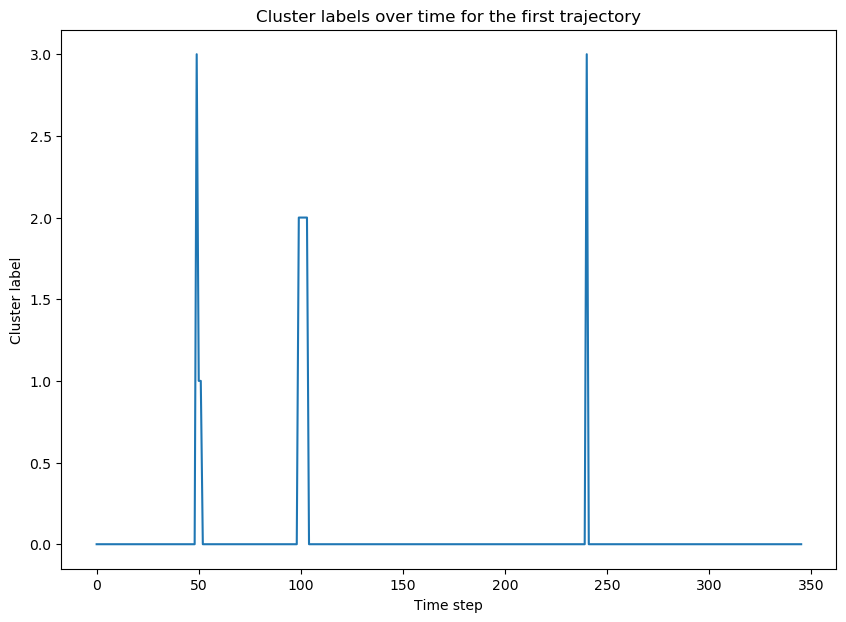

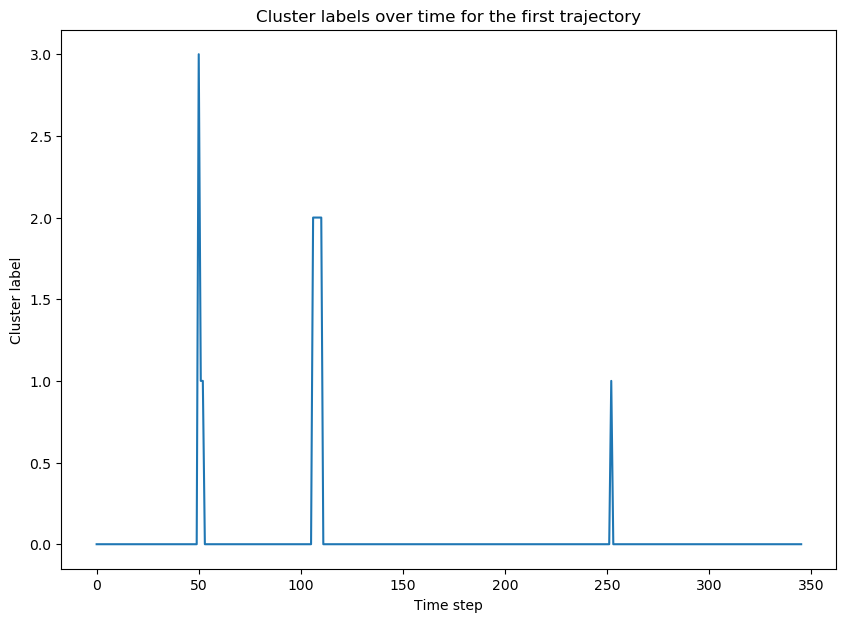

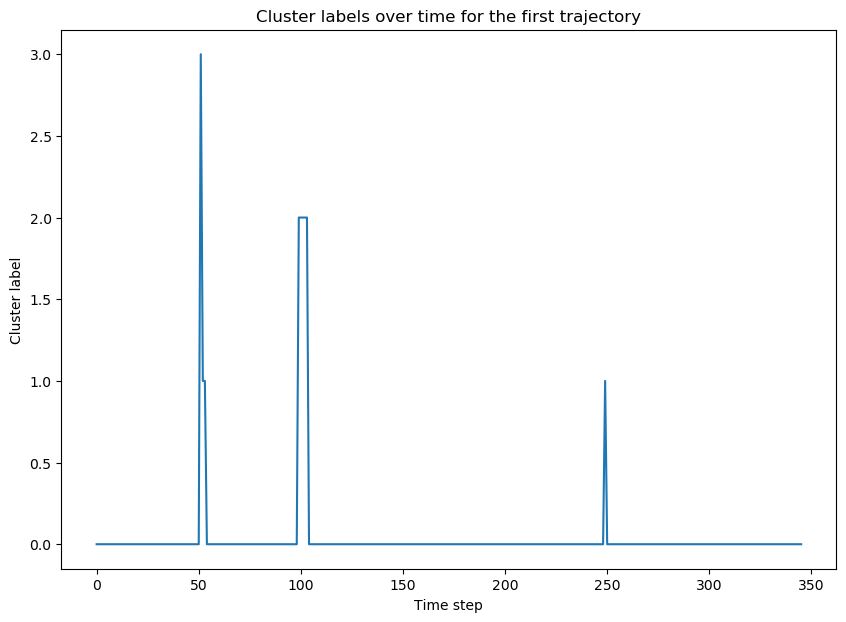

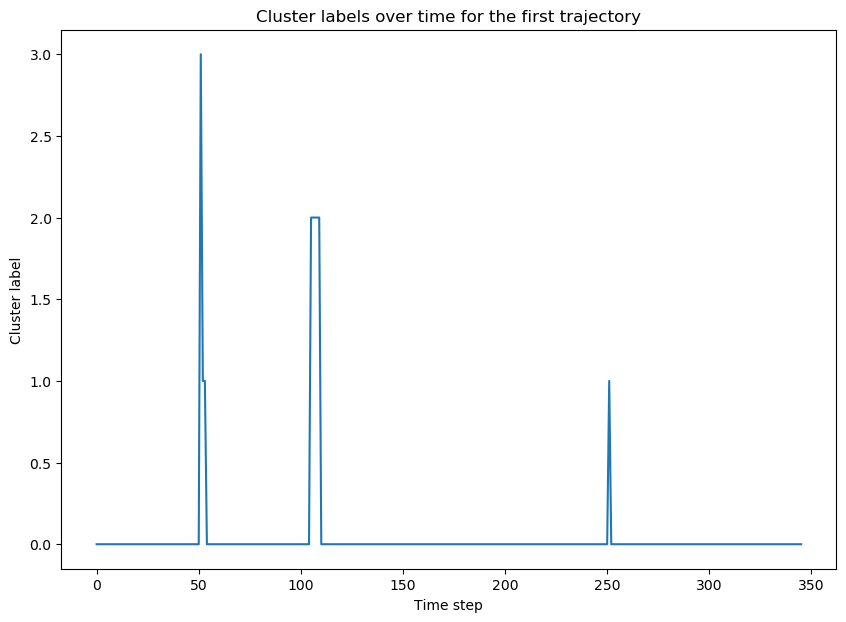

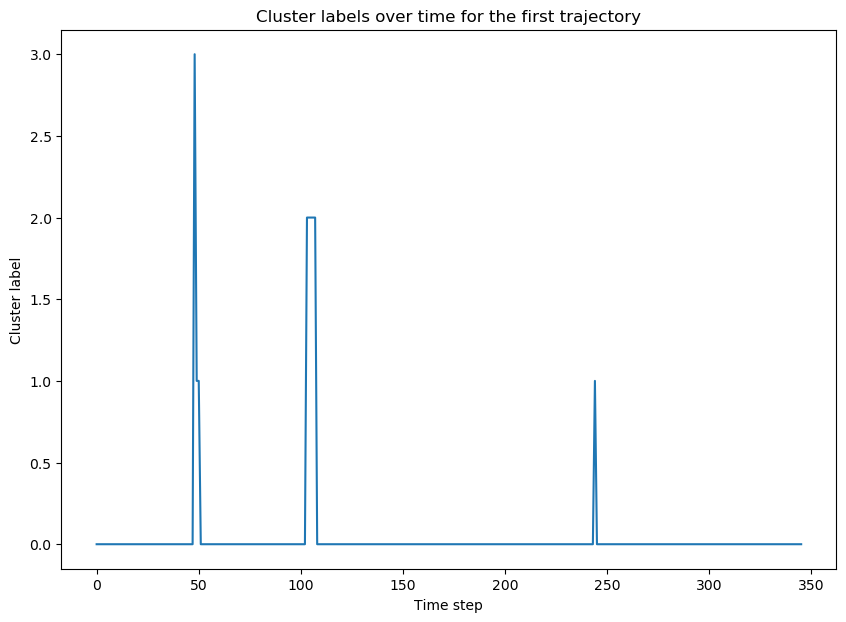

...

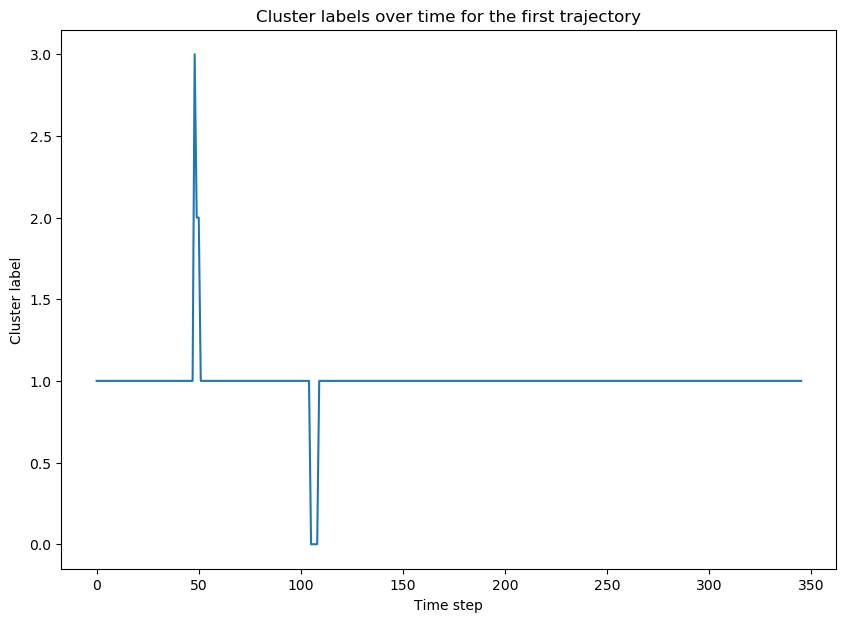

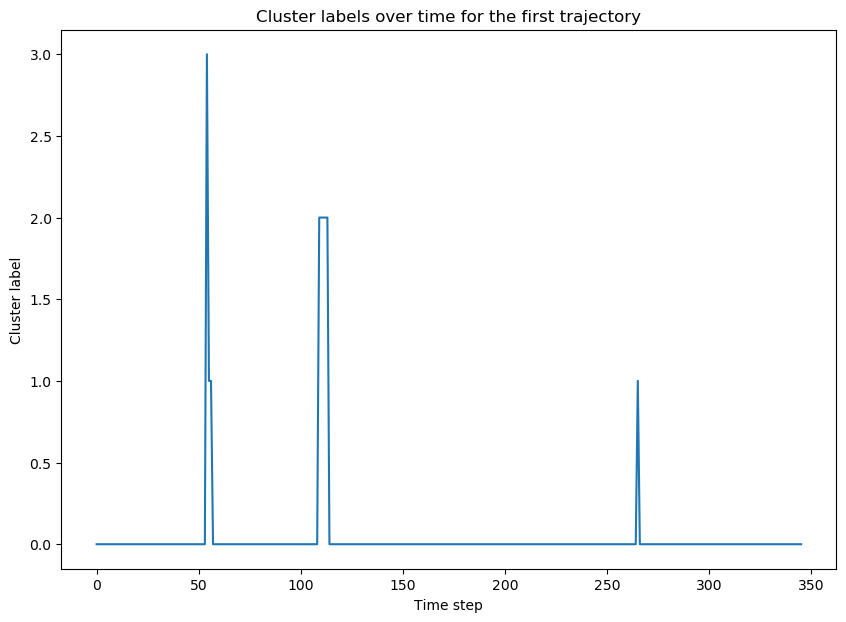

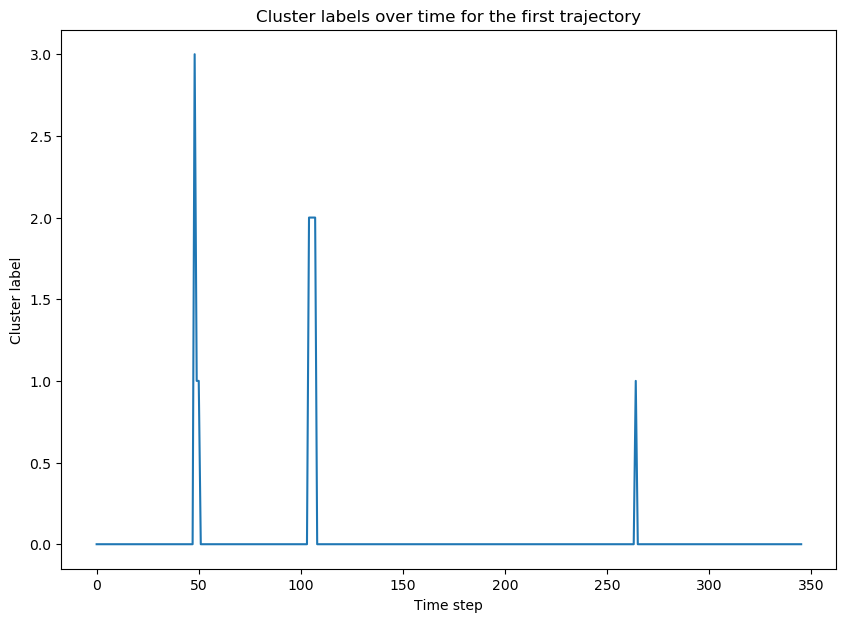

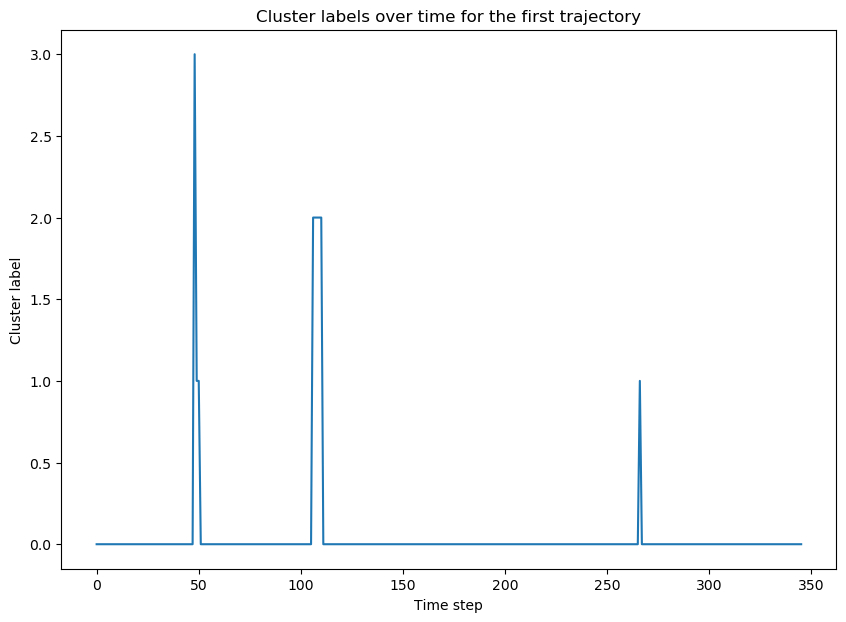

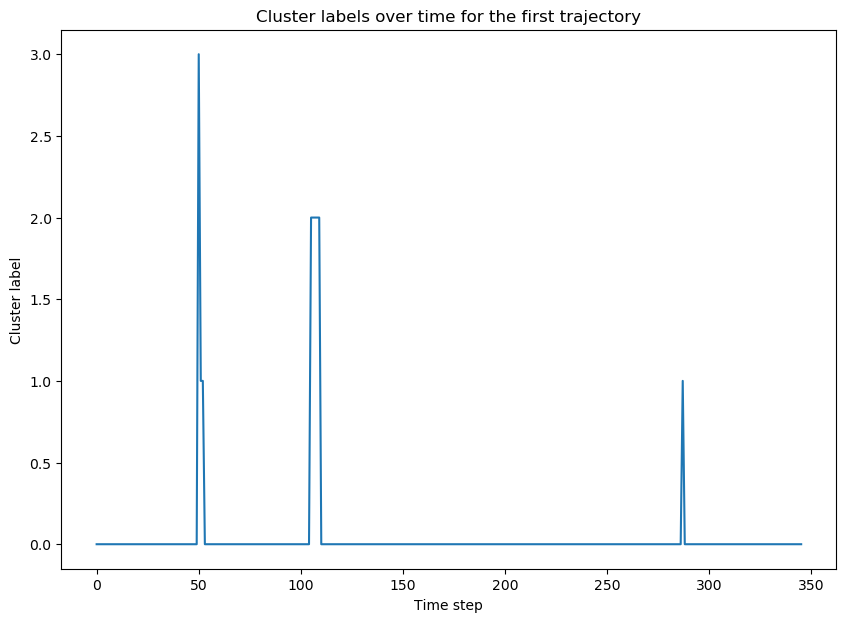

KeyboardInterrupt: 

In [7]:
# Step 1: Convert the tensor to a numpy array and reshape it to 2D if necessary
actions = dataset['observations'].numpy()
actions = actions.reshape((actions.shape[0], -1))

spectral = SpectralClustering(n_clusters=4)


for start, end in zip(start_indices, end_indices):
    # Extract the actions for the current trajectory
    actions_trajectory = actions[start:end]

    # Fit the K-means algorithm on the actions of the current trajectory
    labels_trajectory = spectral.fit_predict(actions_trajectory)


    # Convert the list of all labels to a numpy array
    all_labels = np.array(labels_trajectory)

    # Get the labels for the first trajectory
    labels_first_trajectory = all_labels[start_indices[0]:end_indices[0]]

    # Plot the labels over time for the first trajectory
    plt.figure(figsize=(10, 7))
    plt.plot(labels_first_trajectory)
    plt.title('Cluster labels over time for the first trajectory')
    plt.xlabel('Time step')
    plt.ylabel('Cluster label')
    plt.show()

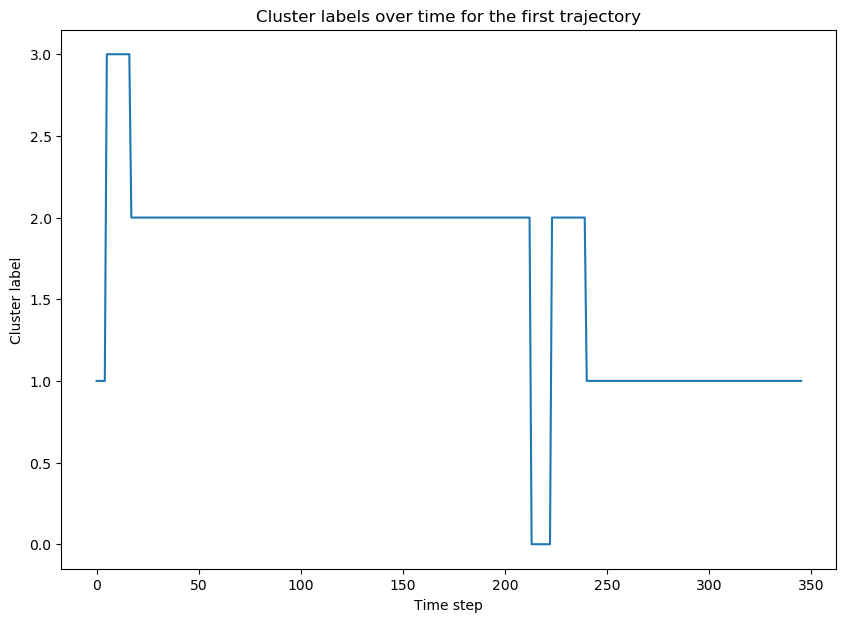

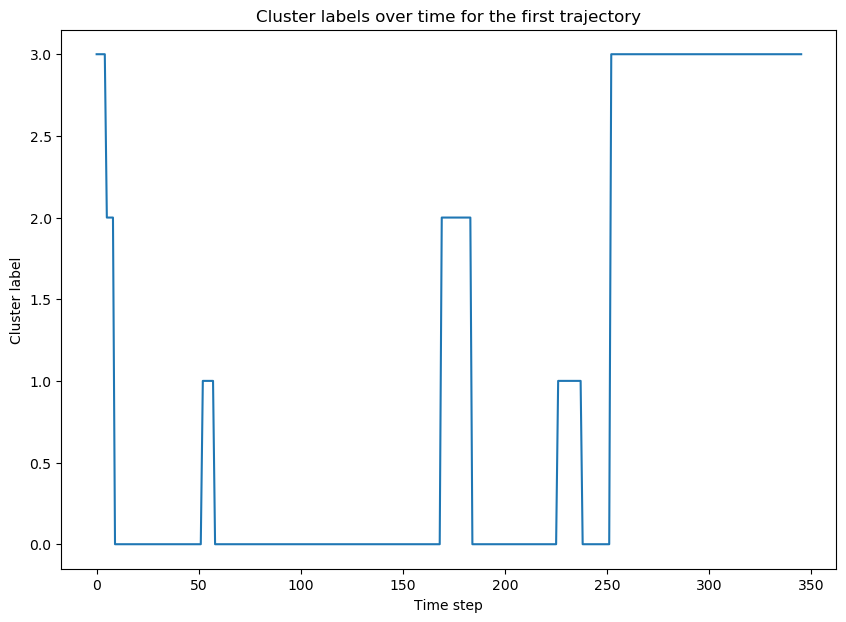

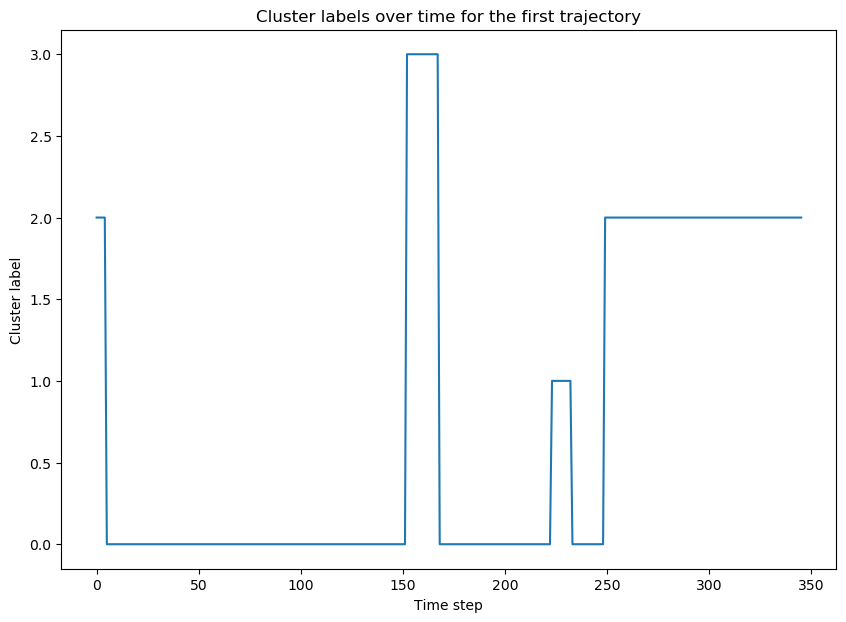

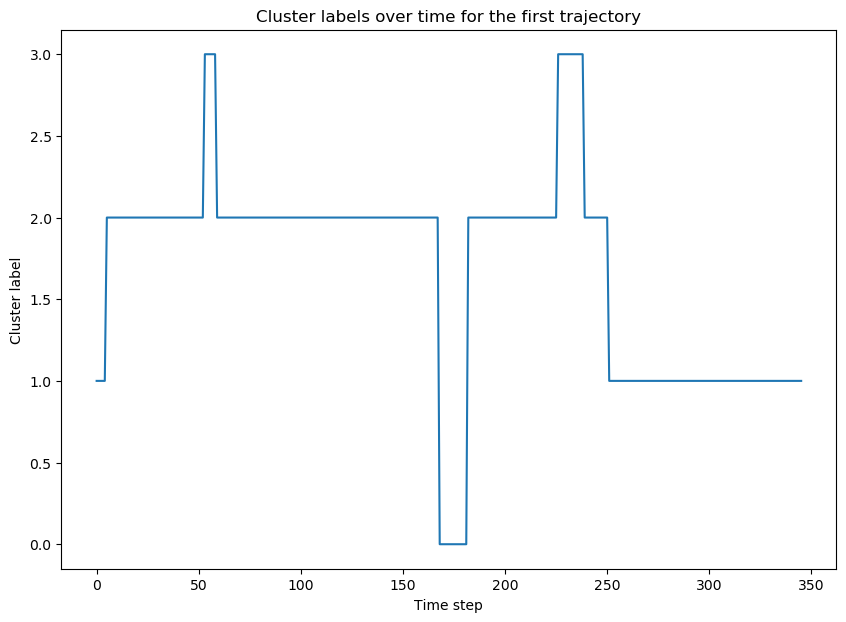

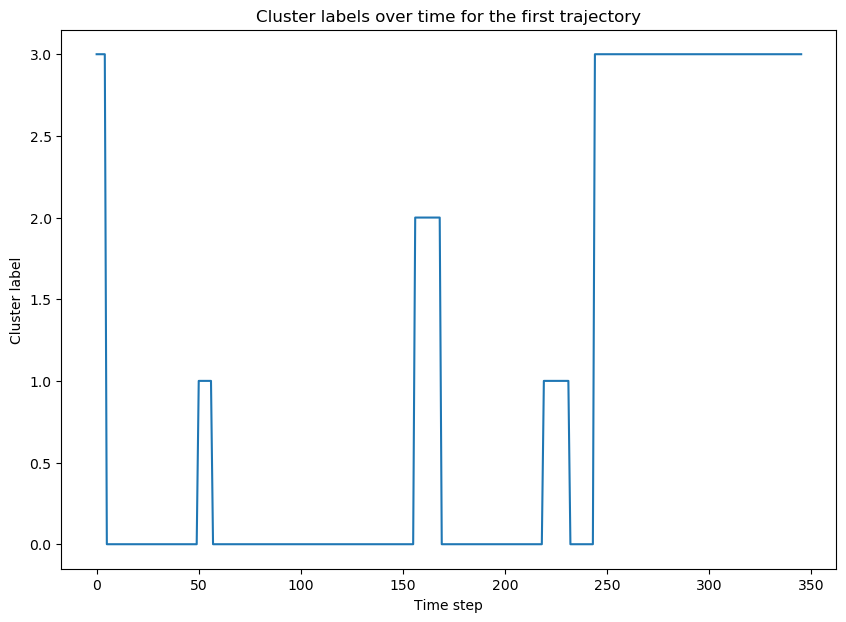

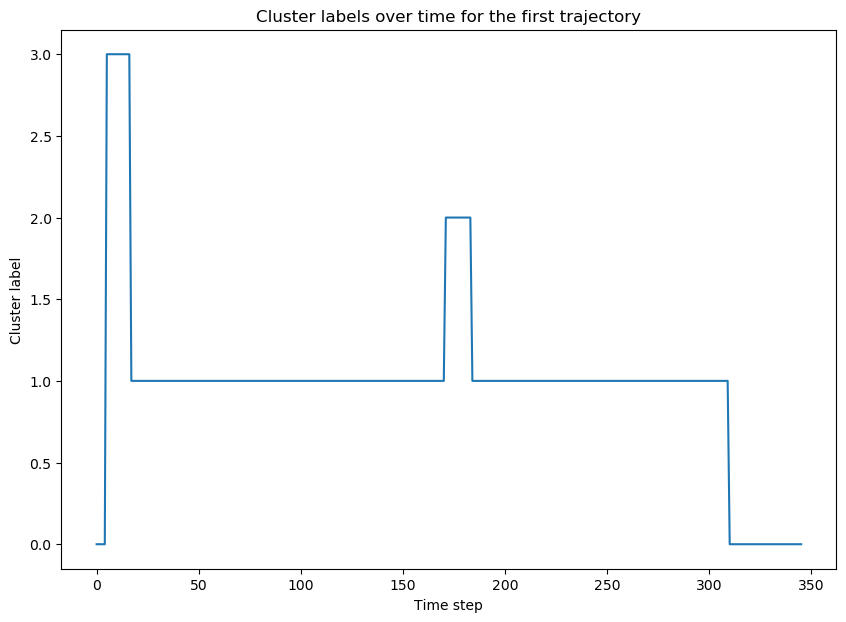

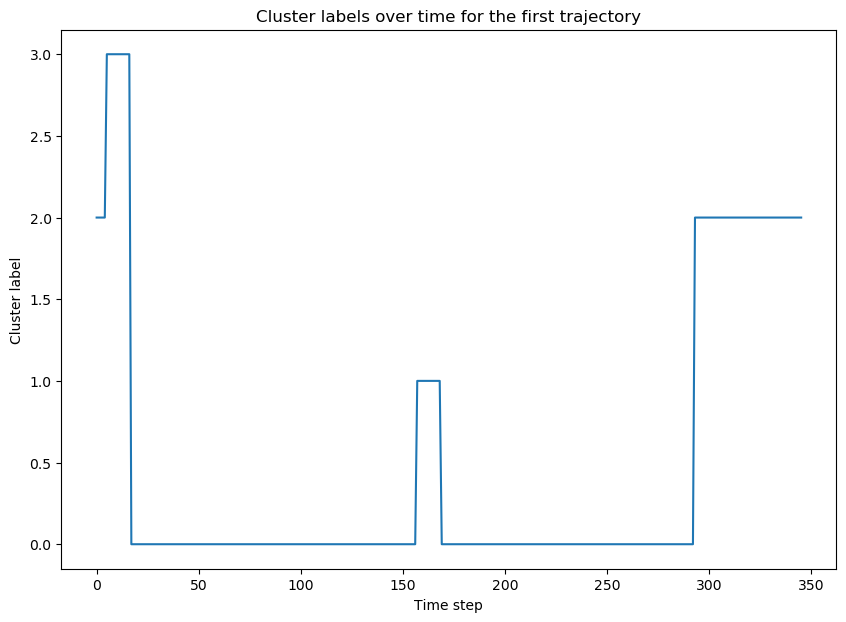

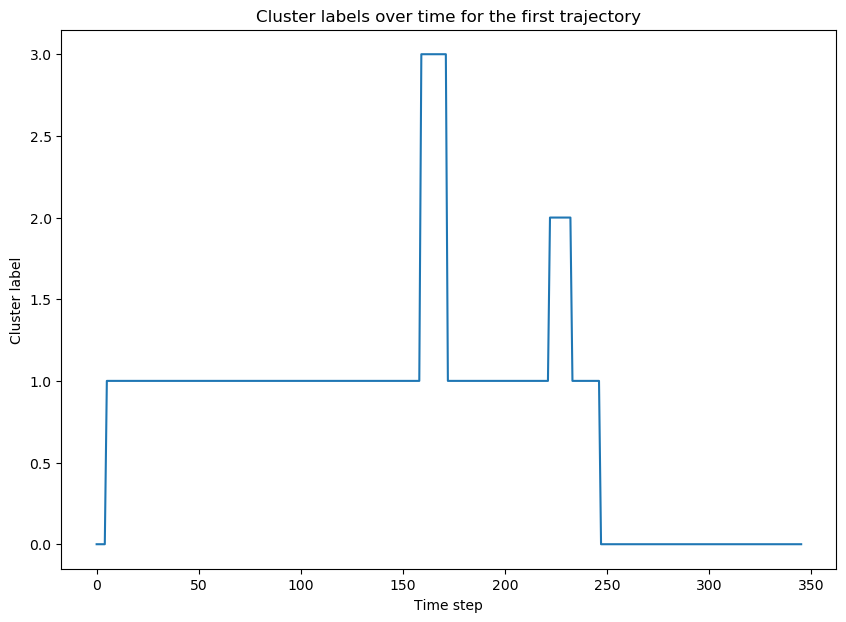

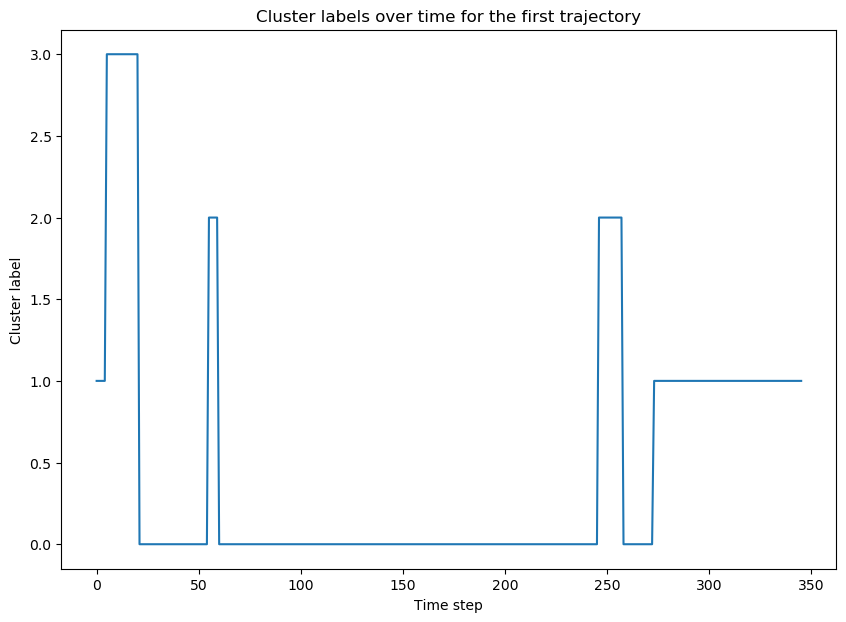

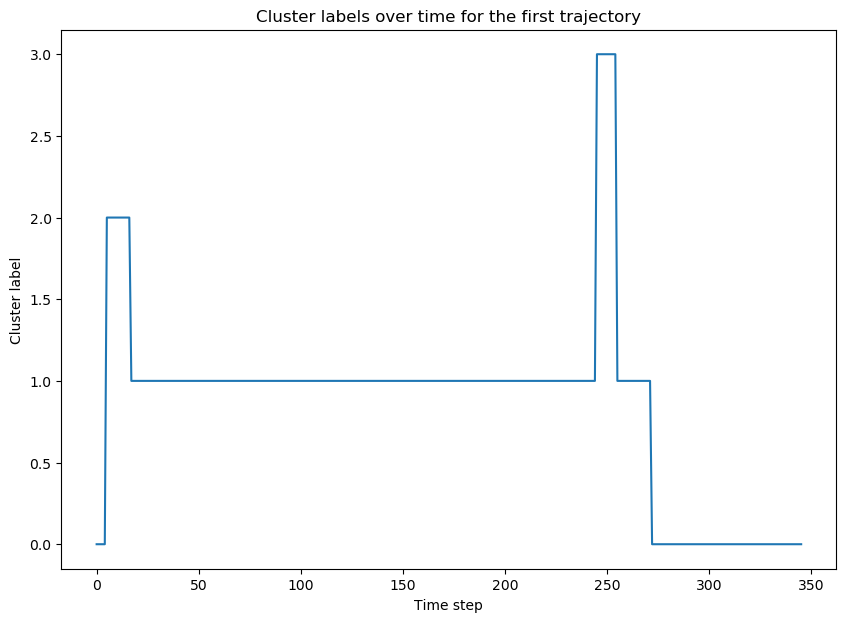

In [7]:
# Step 1: Convert the tensor to a numpy array and reshape it to 2D if necessary
actions = dataset['actions'].numpy()
actions = actions.reshape((actions.shape[0], -1))

spectral = SpectralClustering(n_clusters=4)


for start, end in zip(start_indices[:10], end_indices[:10]):
    # Extract the actions for the current trajectory
    actions_trajectory = actions[start:end]

    # Fit the K-means algorithm on the actions of the current trajectory
    labels_trajectory = spectral.fit_predict(actions_trajectory)


    # Convert the list of all labels to a numpy array
    all_labels = np.array(labels_trajectory)

    # Get the labels for the first trajectory
    labels_first_trajectory = all_labels[start_indices[0]:end_indices[0]]

    # Plot the labels over time for the first trajectory
    plt.figure(figsize=(10, 7))
    plt.plot(labels_first_trajectory)
    plt.title('Cluster labels over time for the first trajectory')
    plt.xlabel('Time step')
    plt.ylabel('Cluster label')
    plt.show()

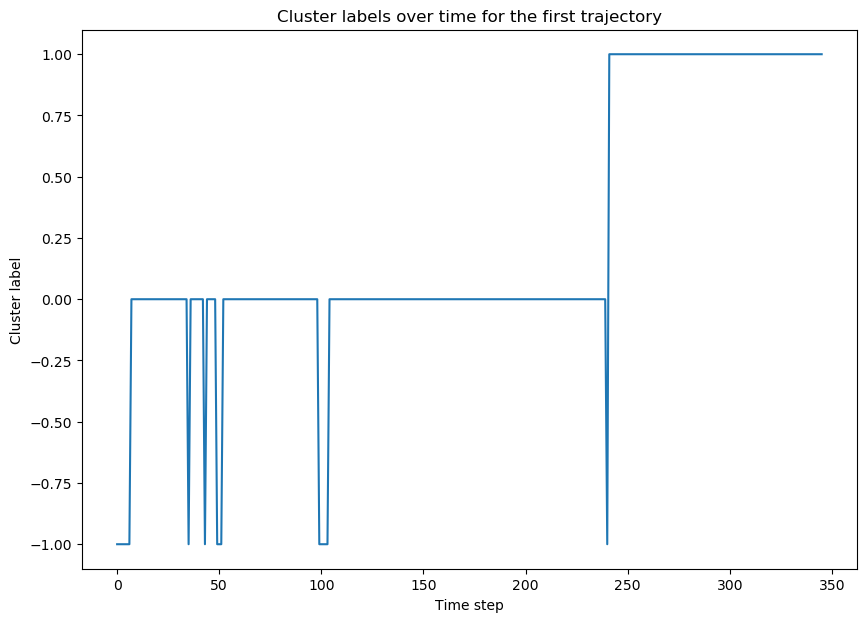

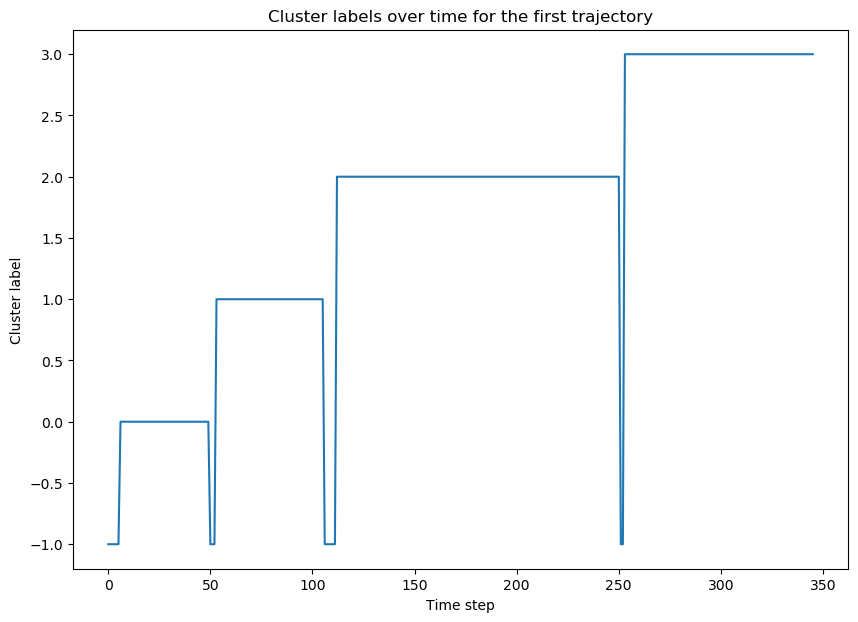

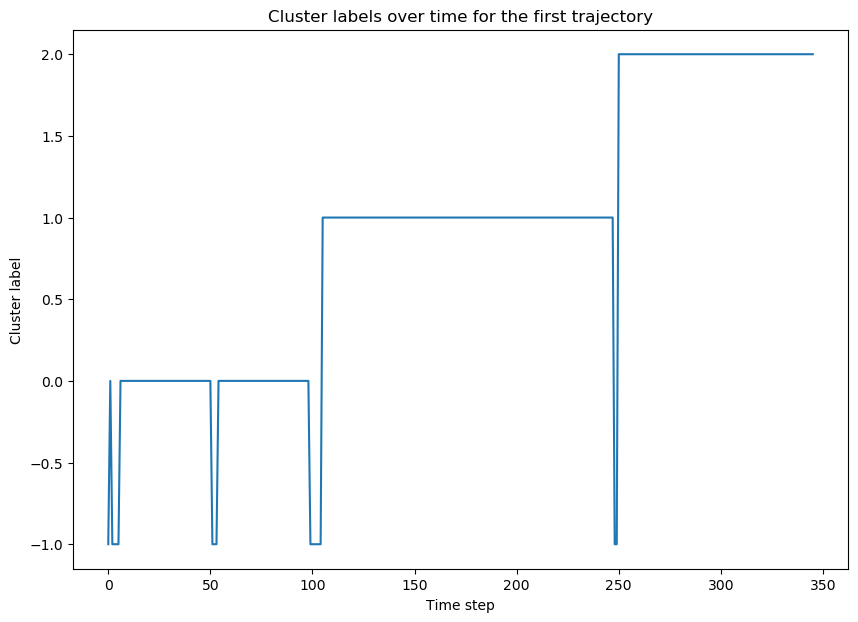

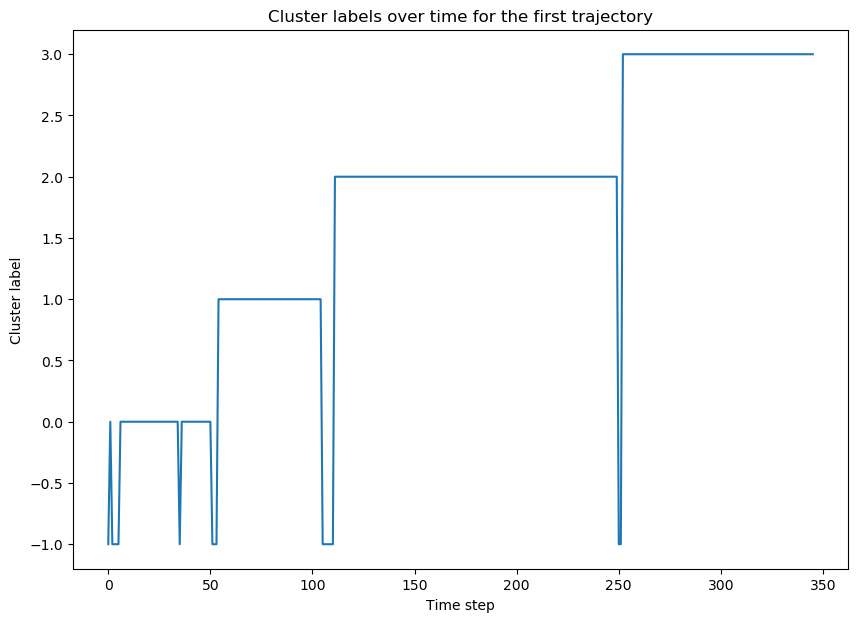

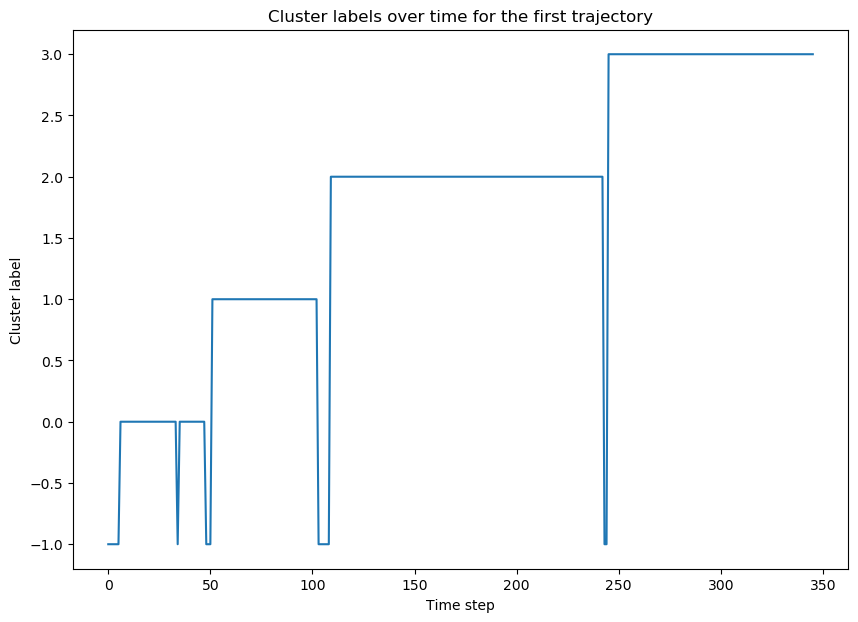

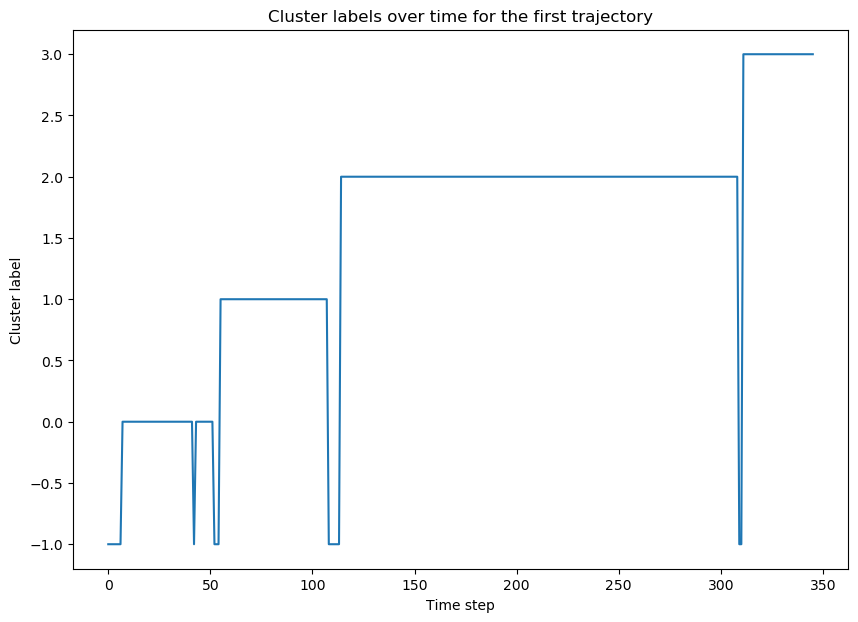

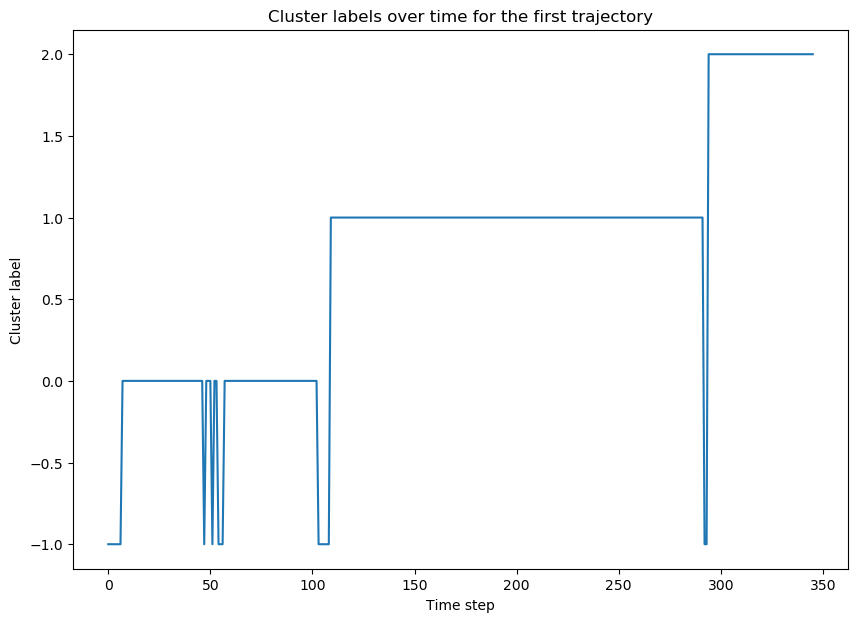

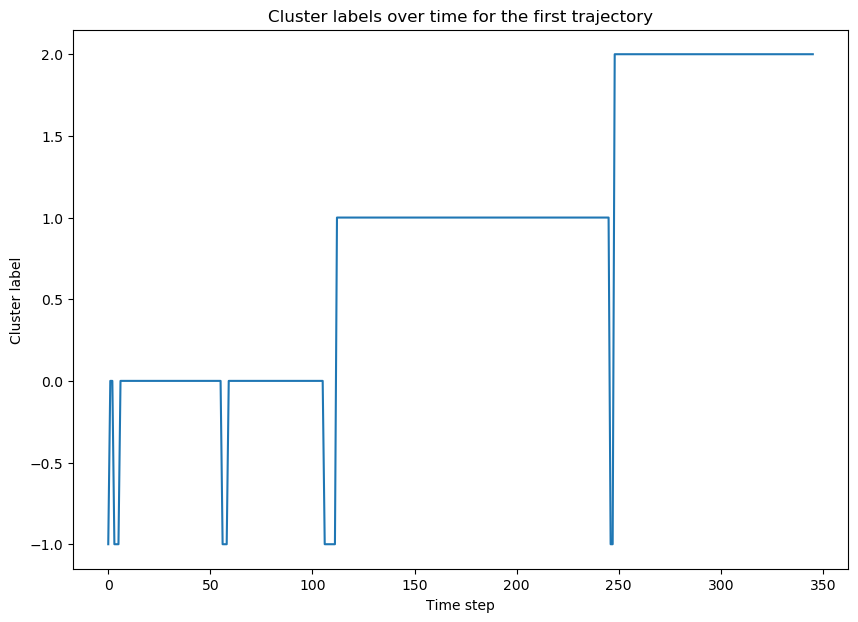

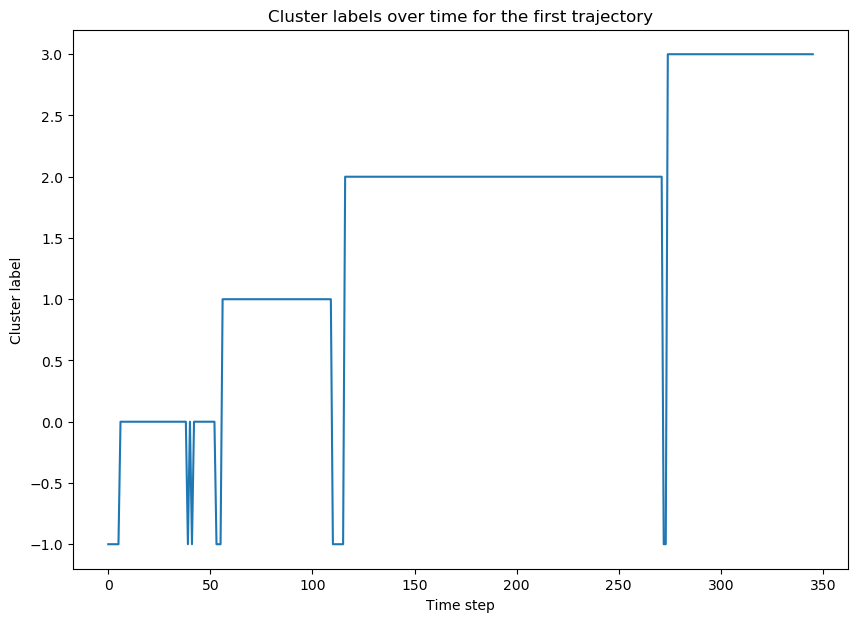

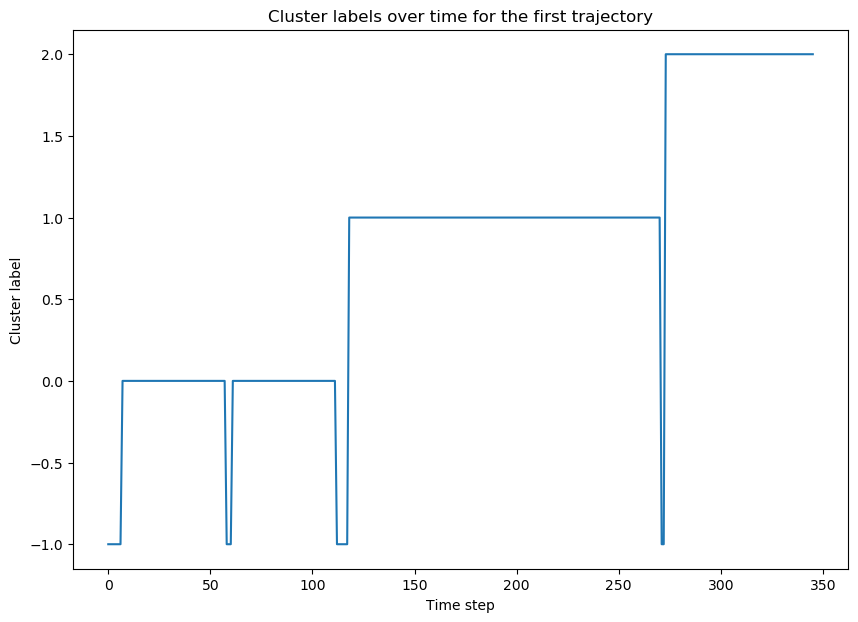

In [5]:
# Step 1: Convert the tensor to a numpy array and reshape it to 2D if necessary
actions = dataset['observations'].numpy()
actions = actions.reshape((actions.shape[0], -1))

dbscan = DBSCAN(eps=0.5, min_samples=10)


# Extract the actions for the current trajectory
#actions_trajectory = actions[start_indices[0]:end_indices[0]]

for start, end in zip(start_indices[:10], end_indices[:10]):
    # Extract the actions for the current trajectory
    actions_trajectory = actions[start:end]

    # Fit the K-means algorithm on the actions of the current trajectory
    labels_trajectory = dbscan.fit_predict(actions_trajectory)


    # Convert the list of all labels to a numpy array
    all_labels = np.array(labels_trajectory)

    # Get the labels for the first trajectory
    labels_first_trajectory = all_labels[start_indices[0]:end_indices[0]]

    # Plot the labels over time for the first trajectory
    plt.figure(figsize=(10, 7))
    plt.plot(labels_first_trajectory)
    plt.title('Cluster labels over time for the first trajectory')
    plt.xlabel('Time step')
    plt.ylabel('Cluster label')
    plt.show()

/home/lorangpi/.local/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


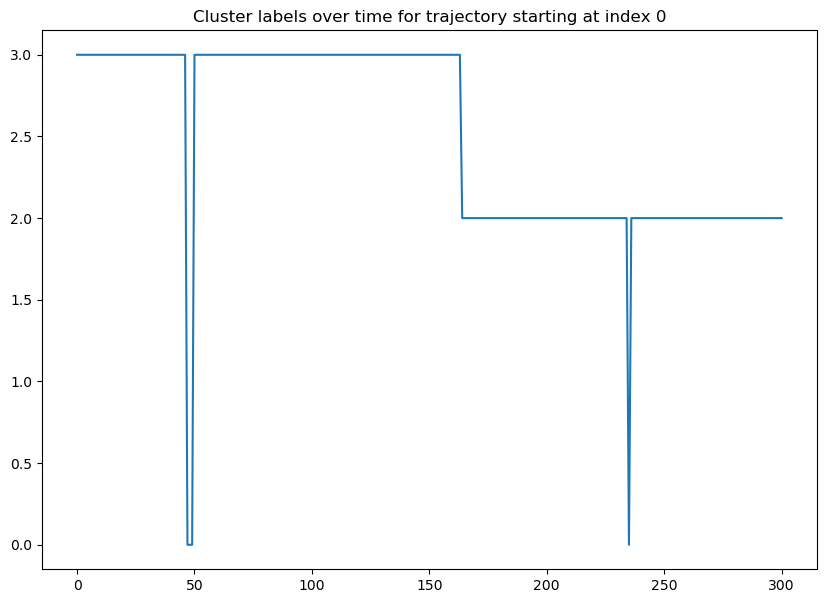

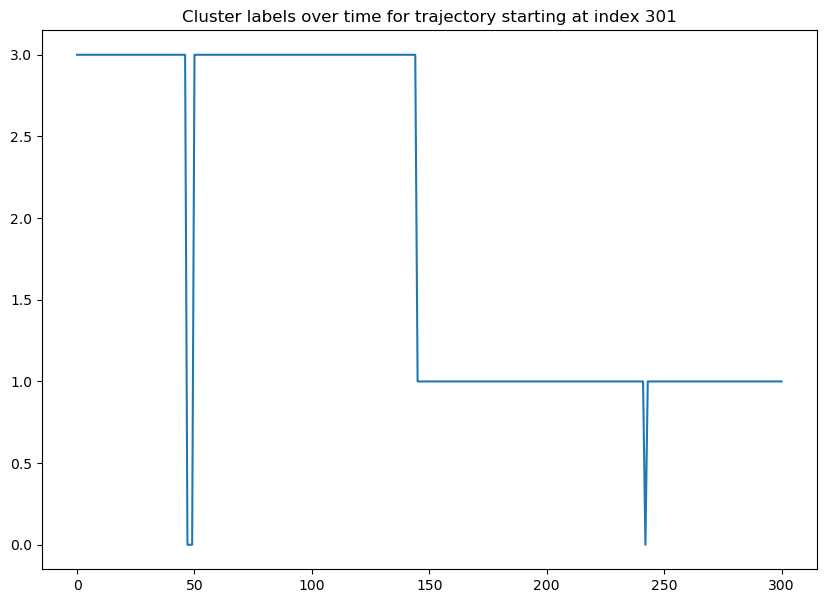

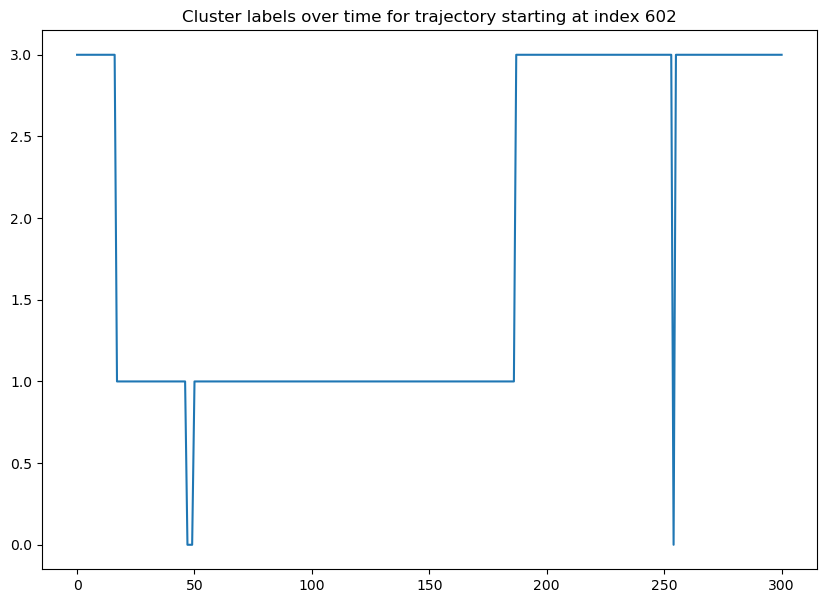

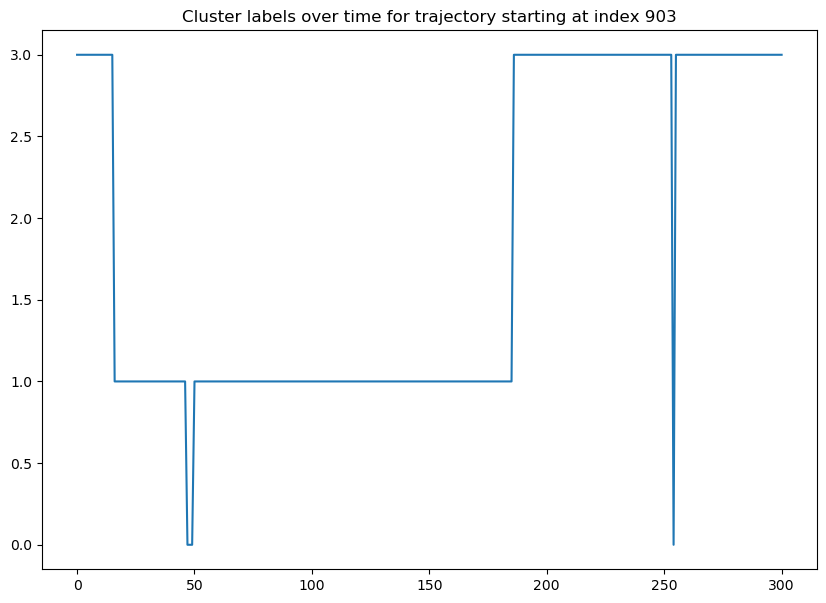

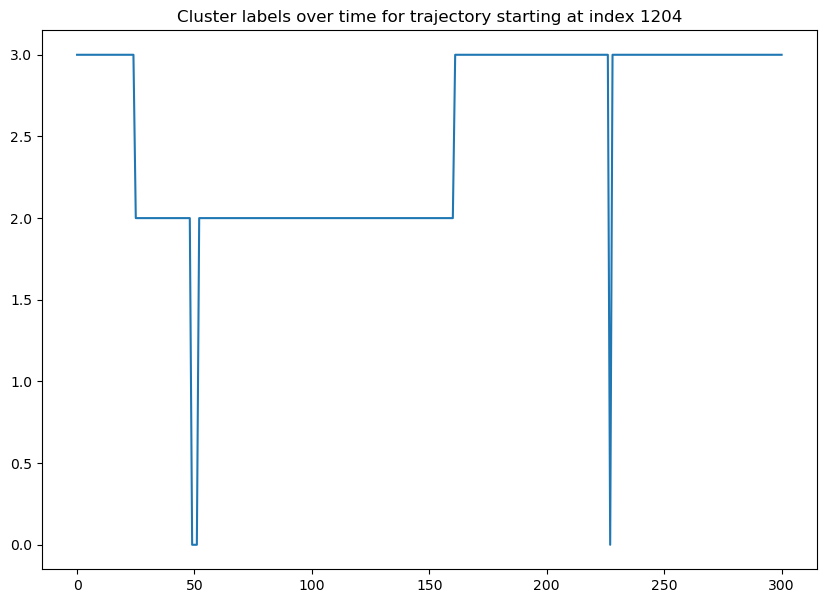

...

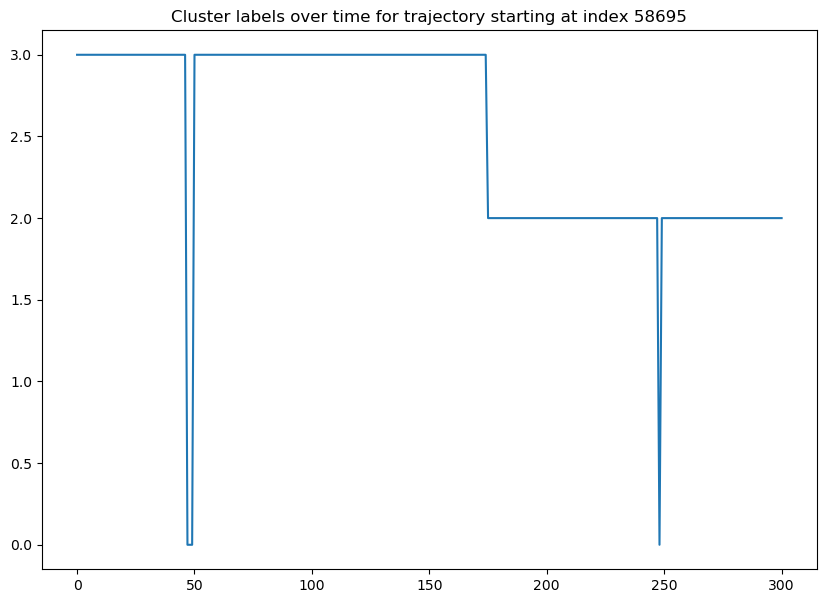

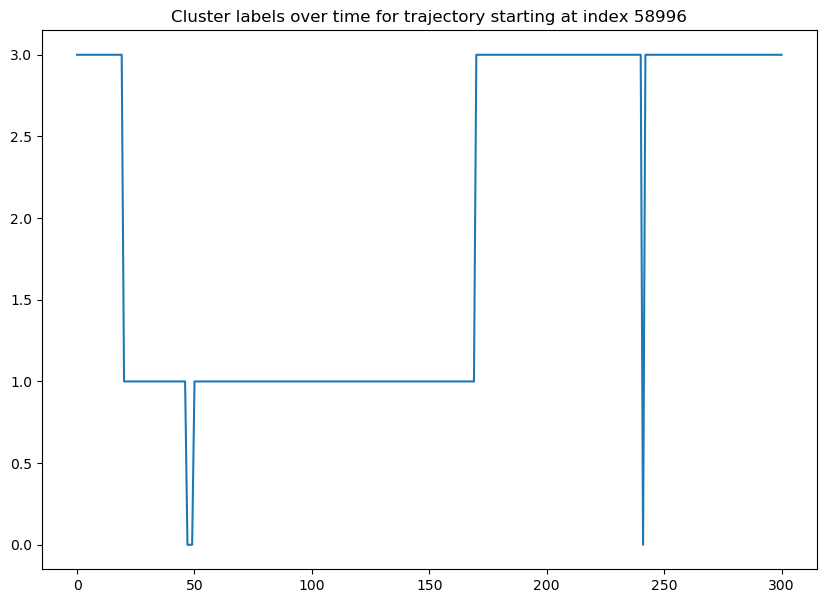

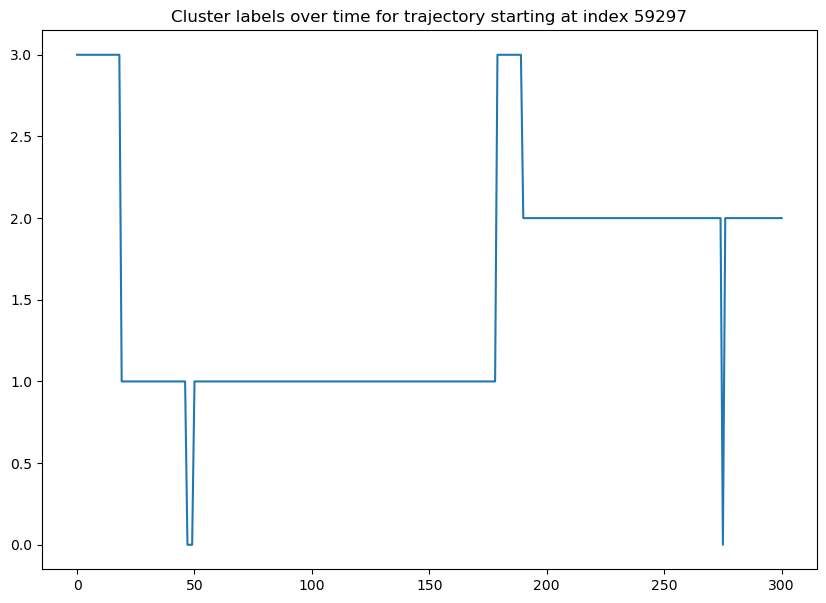

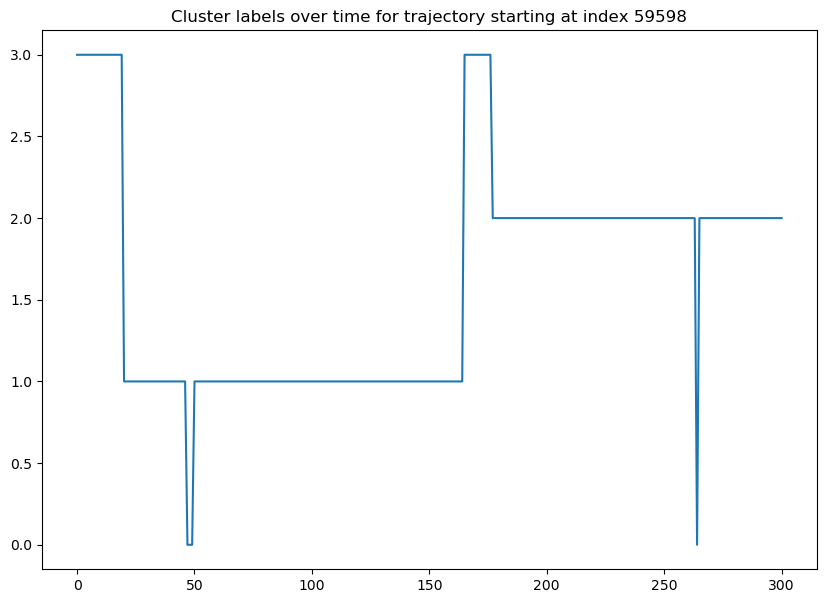

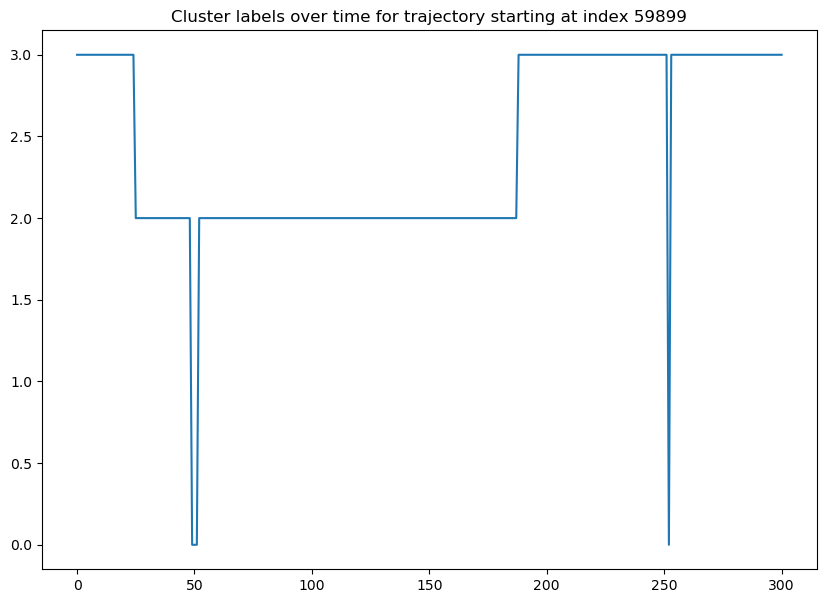

In [10]:
# Step 1: Convert the tensor to a numpy array and reshape it to 2D if necessary
observations = dataset['observations'][].numpy()
observations = observations.reshape((observations.shape[0], -1))

# Step 2: Apply K-means clustering to the original data
kmeans = KMeans(n_clusters=4)  # or any other number depending on the number of steps you expect
kmeans.fit(observations)

# Step 3: Label the original data points based on the cluster they belong to
labels = kmeans.labels_

# Plot the cluster labels over time for each trajectory
# This assumes that each trajectory is a separate sequence in your original data
# and that you know the start and end indices of each trajectory
for start, end in zip(start_indices, end_indices):
    plt.figure(figsize=(10, 7))
    plt.plot(range(0, max_len_act), labels[start:end])
    plt.title(f'Cluster labels over time for trajectory starting at index {start}')
    plt.show()

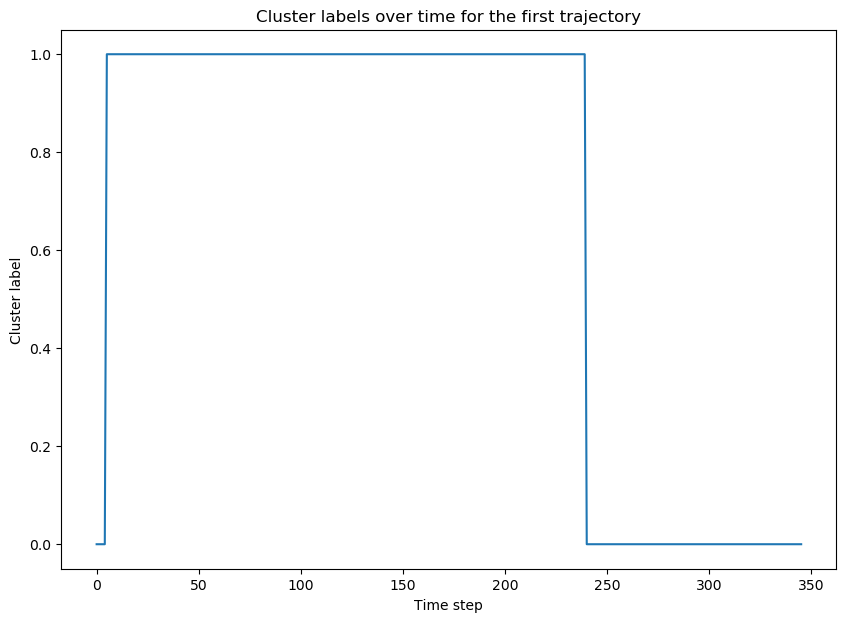

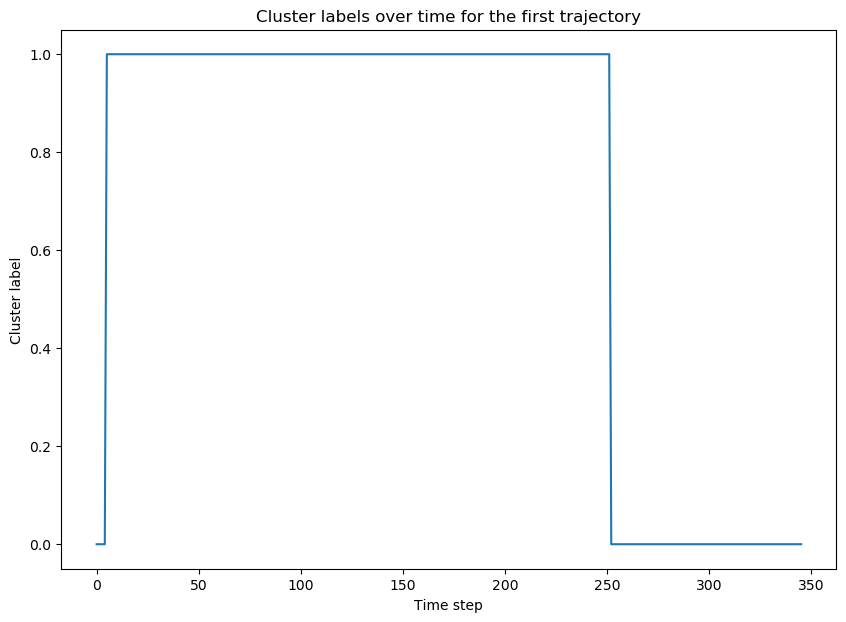

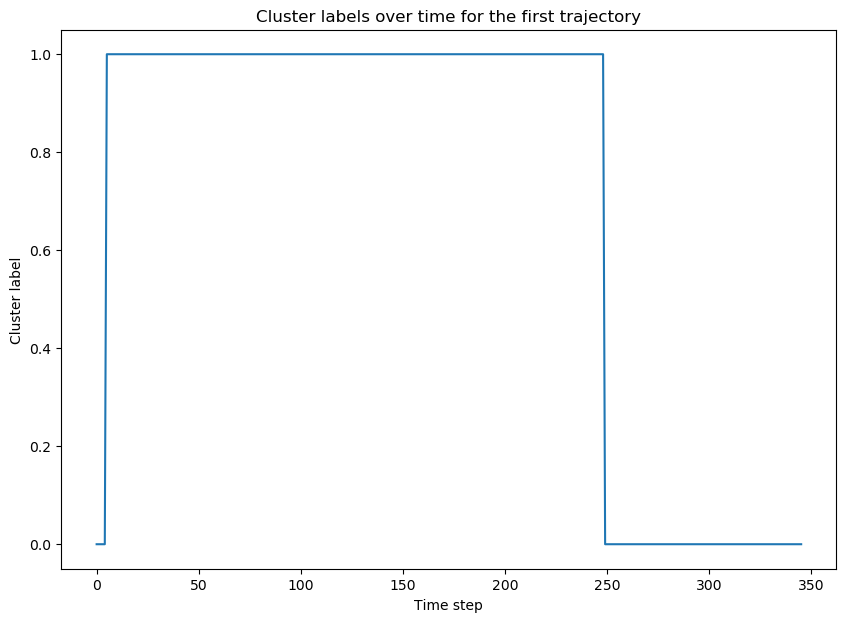

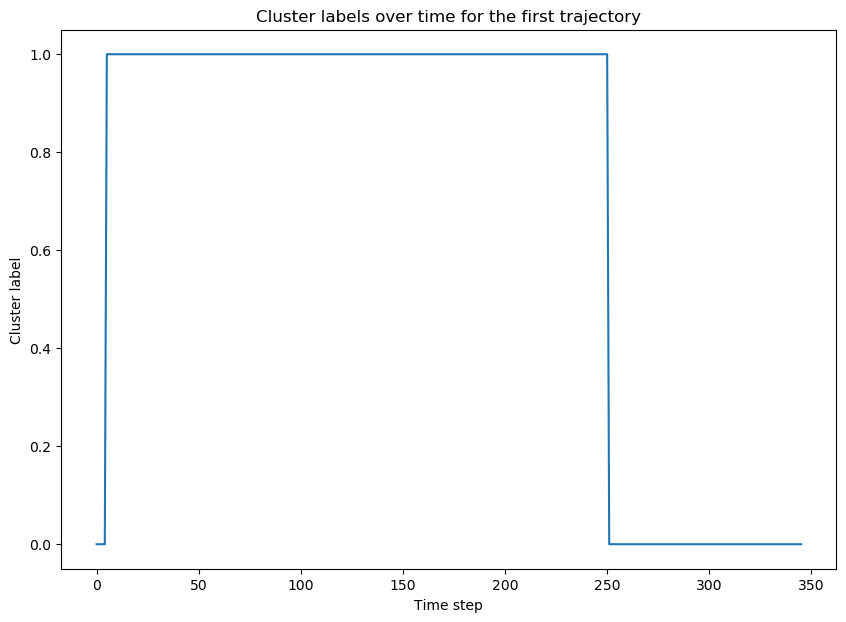

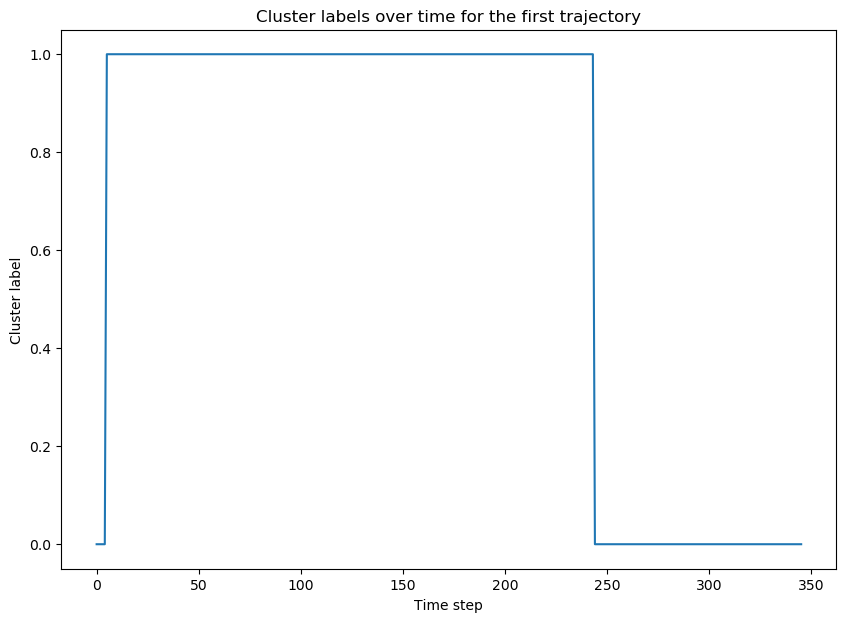

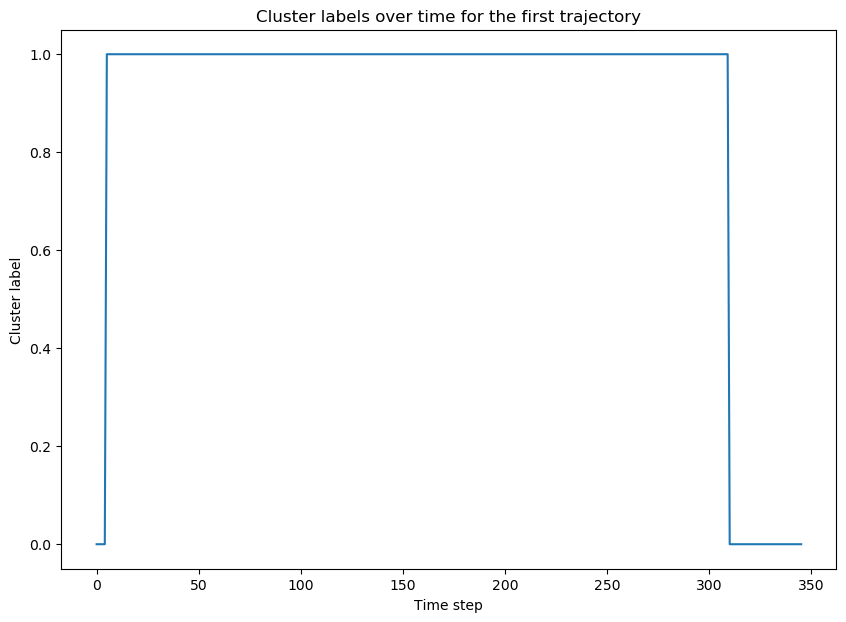

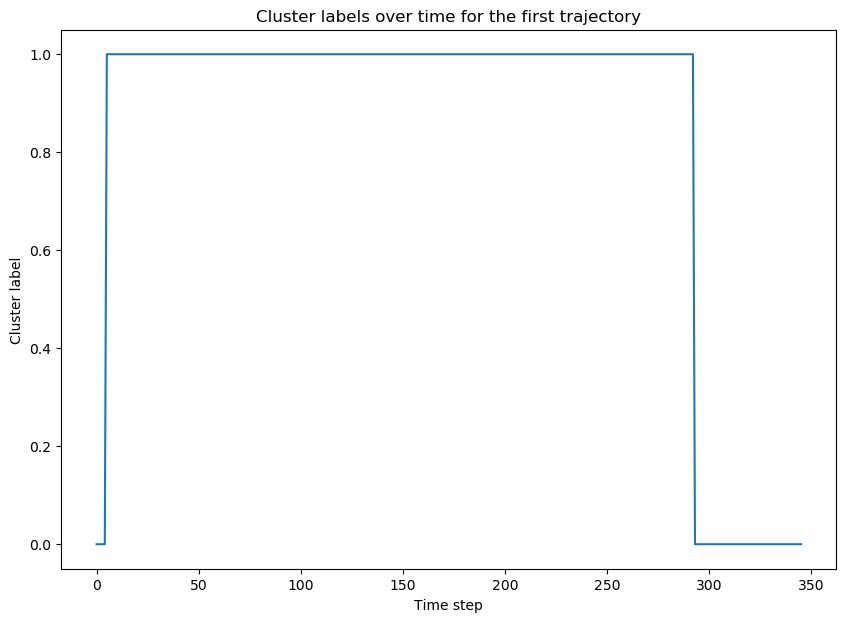

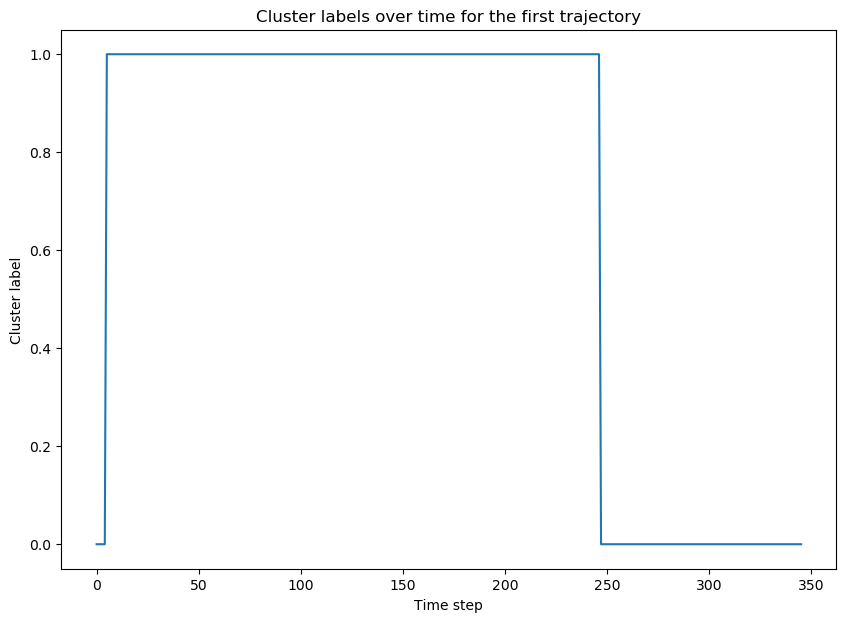

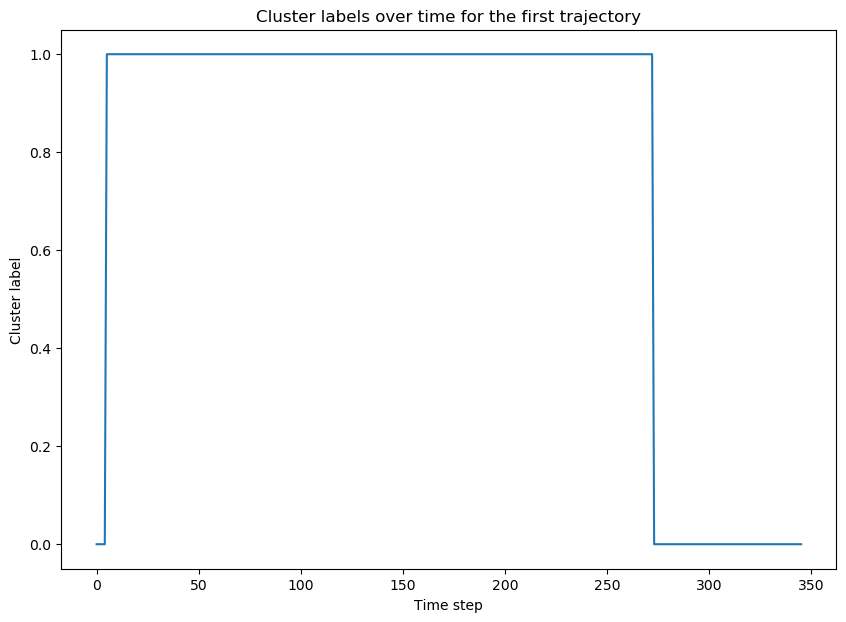

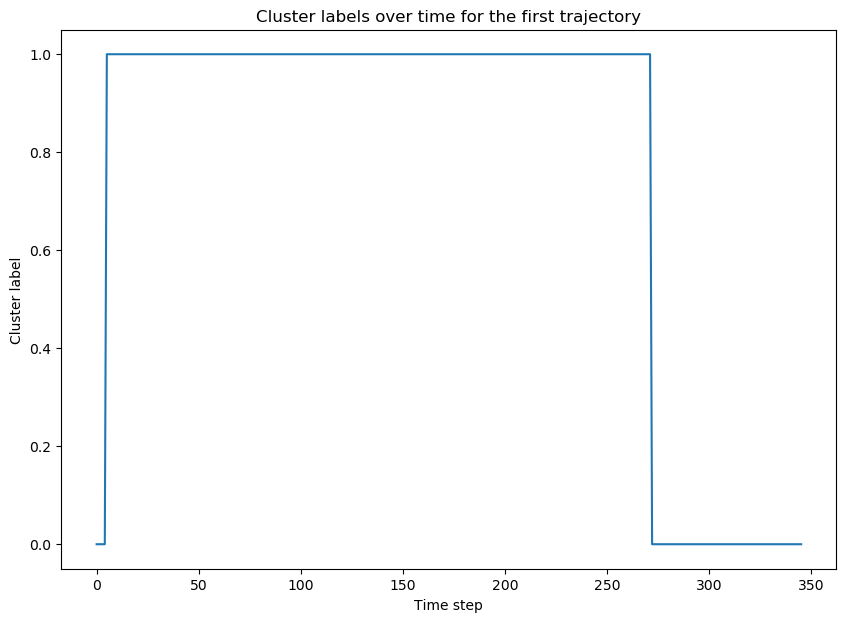

In [6]:
# Step 1: Convert the tensor to a numpy array and reshape it to 2D if necessary
actions = dataset['actions'].numpy()
actions = actions.reshape((actions.shape[0], -1))

dbscan = DBSCAN(eps=0.5, min_samples=10)


# Extract the actions for the current trajectory
#actions_trajectory = actions[start_indices[0]:end_indices[0]]

for start, end in zip(start_indices[:10], end_indices[:10]):
    # Extract the actions for the current trajectory
    actions_trajectory = actions[start:end]

    # Fit the K-means algorithm on the actions of the current trajectory
    labels_trajectory = dbscan.fit_predict(actions_trajectory)


    # Convert the list of all labels to a numpy array
    all_labels = np.array(labels_trajectory)

    # Get the labels for the first trajectory
    labels_first_trajectory = all_labels[start_indices[0]:end_indices[0]]

    # Plot the labels over time for the first trajectory
    plt.figure(figsize=(10, 7))
    plt.plot(labels_first_trajectory)
    plt.title('Cluster labels over time for the first trajectory')
    plt.xlabel('Time step')
    plt.ylabel('Cluster label')
    plt.show()

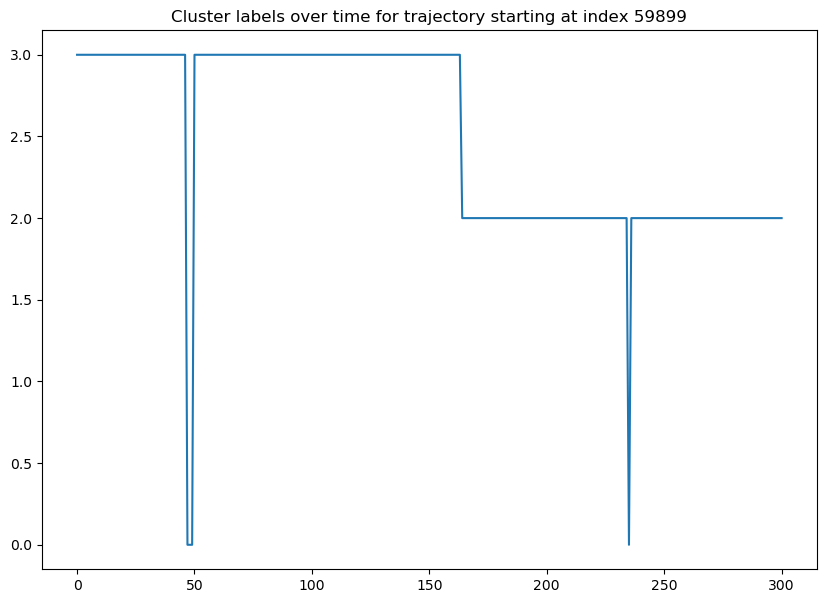

0 	 [0. 0. 1. 0.]
1 	 [0. 0. 1. 0.]
2 	 [0. 0. 1. 0.]
3 	 [0. 0. 1. 0.]
4 	 [0. 0. 1. 0.]
5 	 [0.6951989  0.33643928 0.         0.        ]
6 	 [0.680852   0.32793817 0.         0.        ]
7 	 [0.6529428  0.31518784 0.         0.        ]
8 	 [0.62482667 0.30249366 0.         0.        ]
9 	 [0.59780043 0.28981432 0.         0.        ]
10 	 [0.5716016  0.27709156 0.         0.        ]
11 	 [0.5462364 0.2641923 0.        0.       ]
12 	 [0.52150327 0.25103053 0.         0.        ]
13 	 [0.49722207 0.23759672 0.         0.        ]
14 	 [0.47328714 0.22394119 0.         0.        ]
15 	 [0.44964176 0.21015762 0.         0.        ]
16 	 [0.42626843 0.19636719 0.         0.        ]
17 	 [0.4031787  0.18270501 0.         0.        ]
18 	 [0.38040346 0.16930862 0.         0.        ]
19 	 [0.357986   0.15630881 0.         0.        ]
20 	 [0.3359771  0.14382273 0.         0.        ]
21 	 [0.31443077 0.131949   0.         0.        ]
22 	 [0.29340047 0.12076551 0.         0.        ]
2

In [11]:
# Step 1: Convert the tensor to a numpy array and reshape it to 2D if necessary
actions = dataset['actions'].numpy()
actions = actions.reshape((actions.shape[0], -1))
plt.figure(figsize=(10, 7))
plt.plot(range(0, max_len_act), labels[start_indices[0]:end_indices[0]])
plt.title(f'Cluster labels over time for trajectory starting at index {start}')
plt.show()
for val, index in enumerate(actions[start_indices[0]:end_indices[0]]):
    print(val, "\t", index)

/home/lorangpi/.local/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


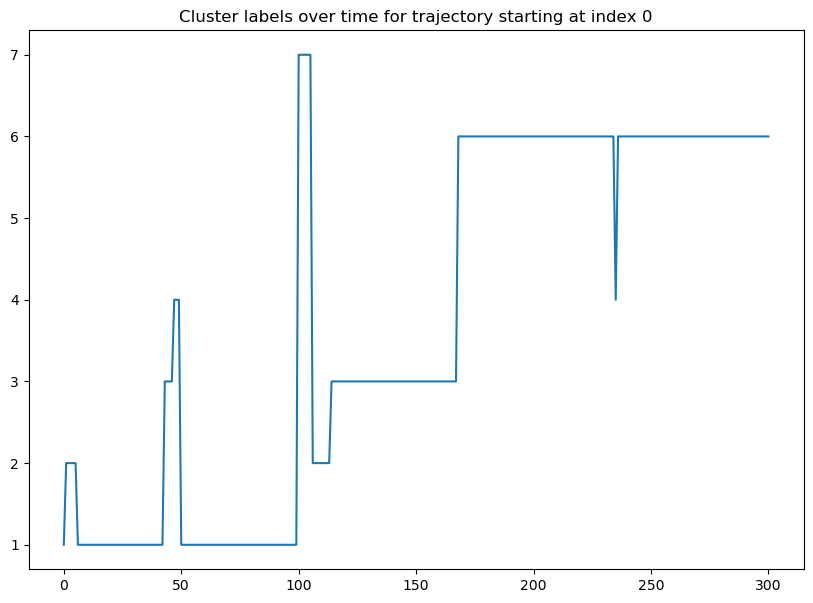

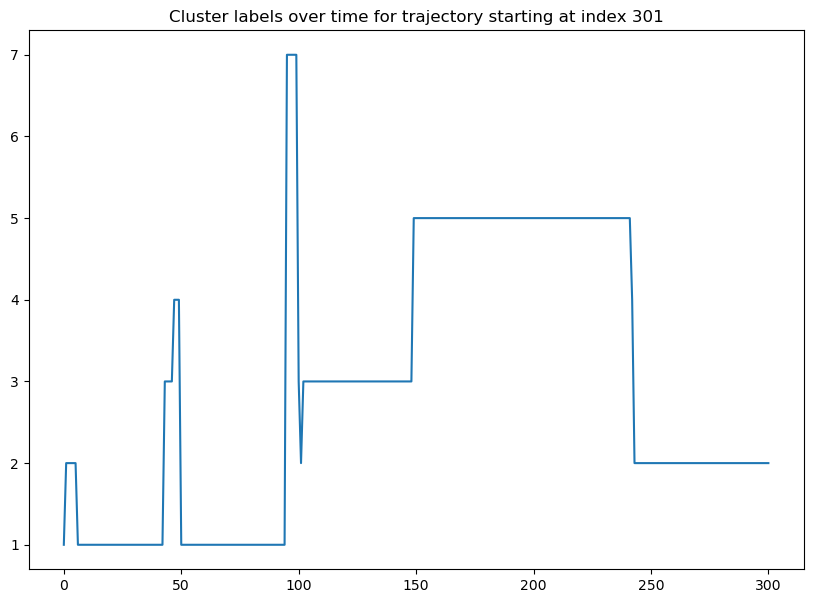

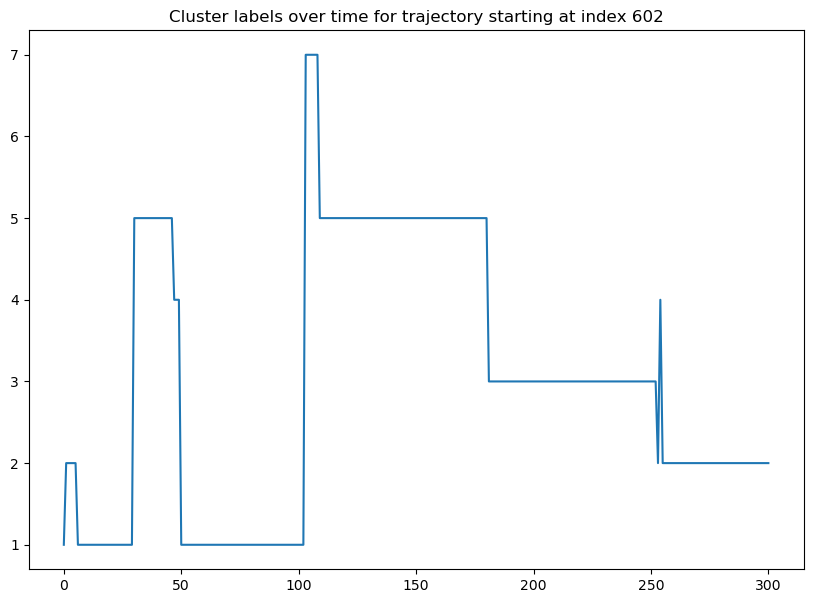

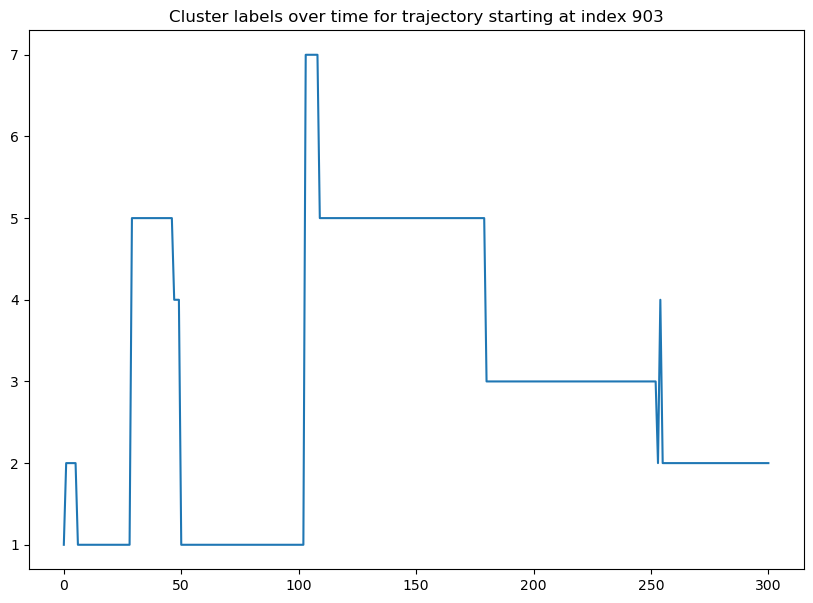

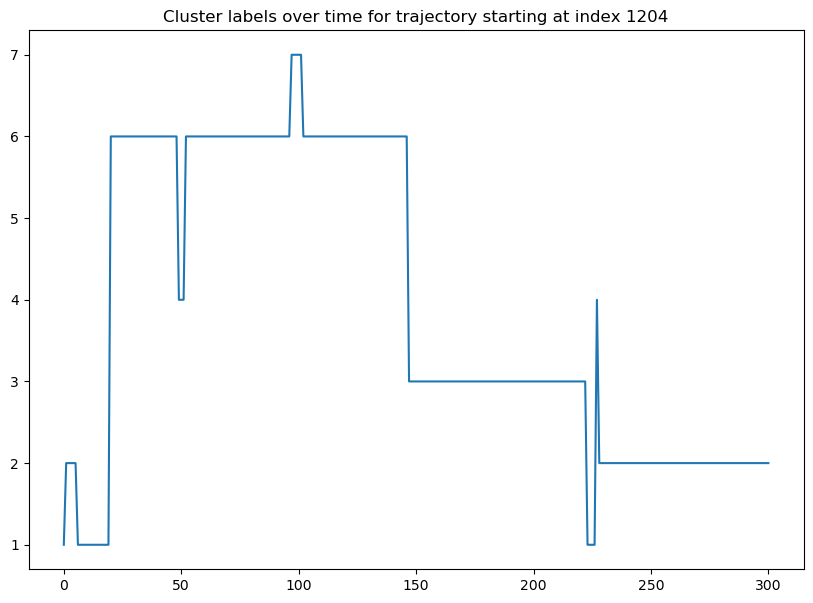

...

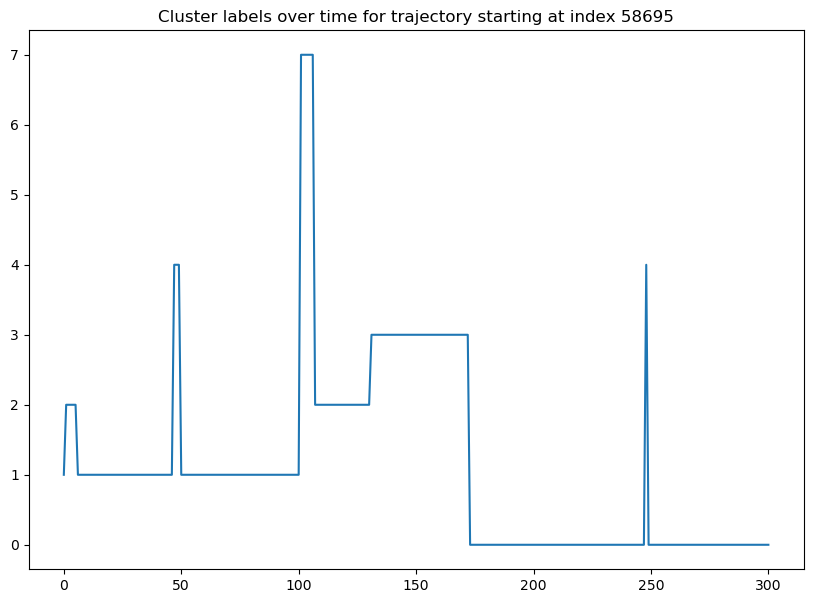

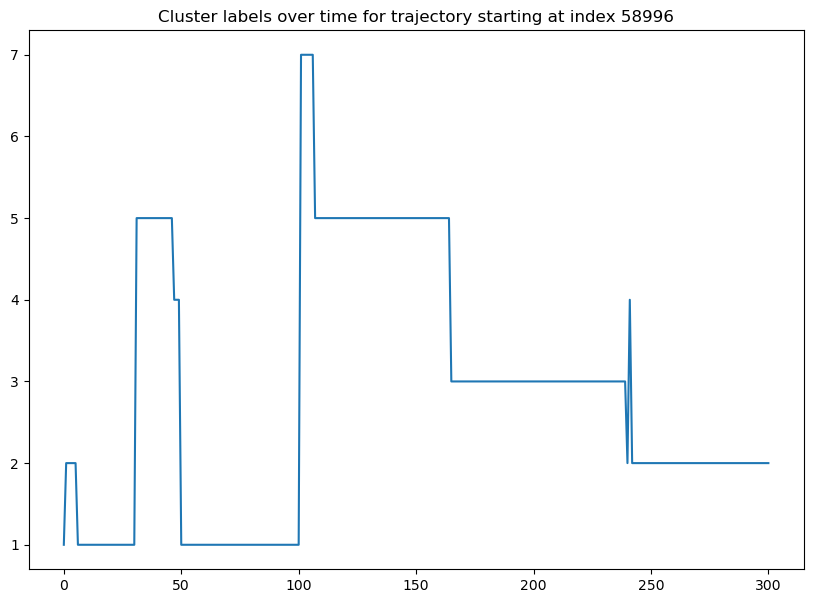

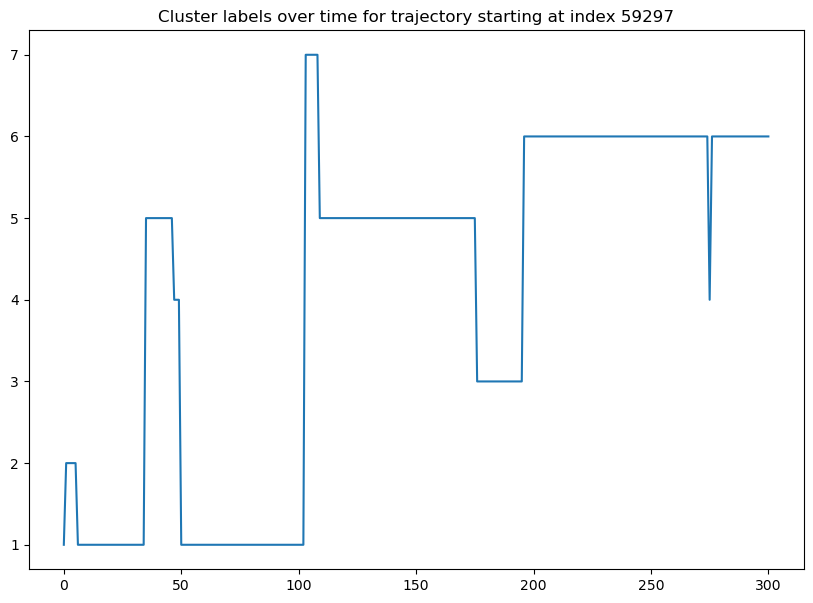

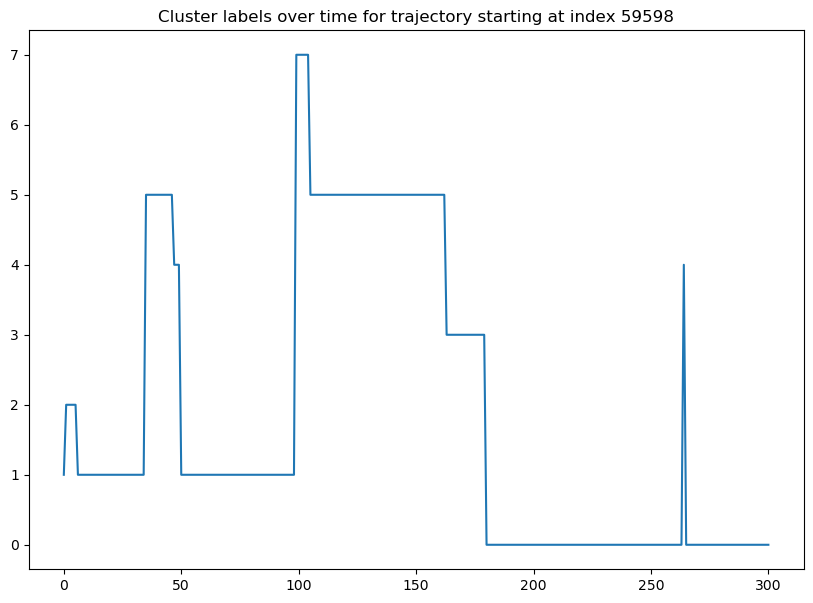

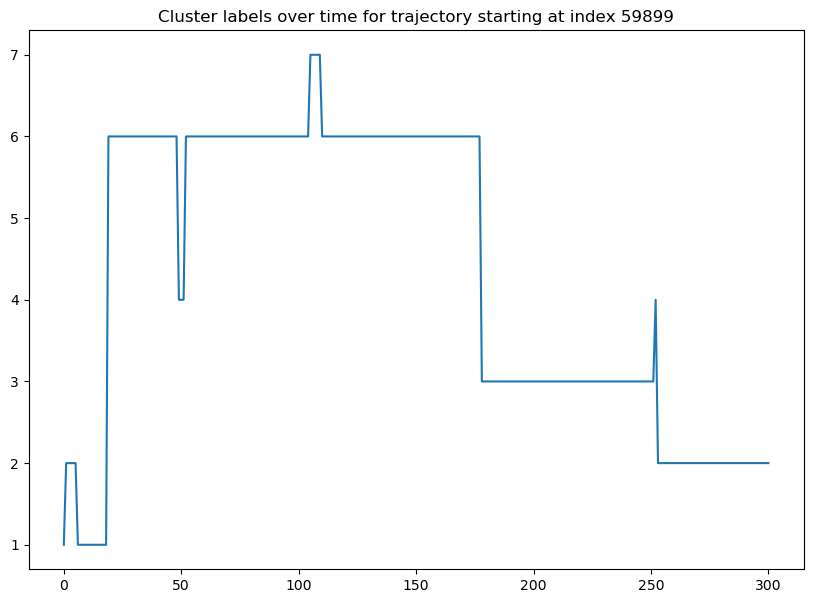

In [14]:
# Step 1: Convert the tensor to a numpy array and reshape it to 2D if necessary
observations = dataset['observations'].numpy()
observations = observations.reshape((observations.shape[0], -1))

# Step 2: Apply K-means clustering to the original data
kmeans = KMeans(n_clusters=8)  # or any other number depending on the number of steps you expect
kmeans.fit(observations)

# Step 3: Label the original data points based on the cluster they belong to
labels = kmeans.labels_

# Plot the cluster labels over time for each trajectory
# This assumes that each trajectory is a separate sequence in your original data
# and that you know the start and end indices of each trajectory
for start, end in zip(start_indices, end_indices):
    plt.figure(figsize=(10, 7))
    plt.plot(range(0, max_len_act), labels[start:end])
    plt.title(f'Cluster labels over time for trajectory starting at index {start}')
    plt.show()

In [7]:
"""
# Step 1: Convert the tensor to a numpy array and reshape it to 2D if necessary
actions = dataset['actions'].numpy()
actions = actions.reshape((actions.shape[0], -1))

# Step 2: Apply K-means clustering to the original data
kmeans = KMeans(n_clusters=3)  # or any other number depending on the number of steps you expect
kmeans.fit(actions)

# Step 3: Label the original data points based on the cluster they belong to
labels = kmeans.labels_

# Plot the cluster labels over time for each trajectory
# This assumes that each trajectory is a separate sequence in your original data
# and that you know the start and end indices of each trajectory
for start, end in zip(start_indices, end_indices):
    plt.figure(figsize=(10, 7))
    plt.plot(range(0, max_len_act), labels[start:end])
    plt.title(f'Cluster labels over time for trajectory starting at index {start}')
    plt.show()
"""

"\n# Step 1: Convert the tensor to a numpy array and reshape it to 2D if necessary\nactions = dataset['actions'].numpy()\nactions = actions.reshape((actions.shape[0], -1))\n\n# Step 2: Apply K-means clustering to the original data\nkmeans = KMeans(n_clusters=3)  # or any other number depending on the number of steps you expect\nkmeans.fit(actions)\n\n# Step 3: Label the original data points based on the cluster they belong to\nlabels = kmeans.labels_\n\n# Plot the cluster labels over time for each trajectory\n# This assumes that each trajectory is a separate sequence in your original data\n# and that you know the start and end indices of each trajectory\nfor start, end in zip(start_indices, end_indices):\n    plt.figure(figsize=(10, 7))\n    plt.plot(range(0, max_len_act), labels[start:end])\n    plt.title(f'Cluster labels over time for trajectory starting at index {start}')\n    plt.show()\n"

In [8]:
from IPython.core.interactiveshell import InteractiveShell
import sys
InteractiveShell.ast_node_interactivity = "all"
np.set_printoptions(threshold=sys.maxsize)

In [9]:
# Step 1: Convert the tensor to a numpy array and reshape it to 2D if necessary
actions = dataset['actions'].numpy()
actions = actions.reshape((actions.shape[0], -1))

# Step 2: Apply PCA to reduce the dimensionality of your data
pca = PCA(n_components=3)  # or any other number less than the number of features
actions_pca = pca.fit_transform(actions)

# Step 2: Apply K-means clustering to the original data
kmeans = KMeans(n_clusters=4)  # or any other number depending on the number of steps you expect
kmeans.fit(actions_pca)

# Step 3: Label the original data points based on the cluster they belong to
labels = kmeans.labels_

# Plot the cluster labels over time for each trajectory
# This assumes that each trajectory is a separate sequence in your original data
# and that you know the start and end indices of each trajectory

plt.figure(figsize=(10, 7))
plt.plot(range(0, max_len_act), labels[start_indices[0]:end_indices[0]])
plt.title(f'Cluster labels over time for trajectory starting at index {start}')
plt.show()
#print(actions[start_indices[0]:end_indices[0]])
for val, index in enumerate(actions[start_indices[0]:end_indices[0]]):
    print(val, "\t", index)

NameError: name 'PCA' is not defined

In [10]:
"""
from sklearn.cluster import DBSCAN
# Step 1: Convert the tensor to a numpy array and reshape it to 2D if necessary
actions = dataset['actions'].numpy()
actions = actions.reshape((actions.shape[0], -1))
dbscan = DBSCAN(eps=0.5, min_samples=5)
labels = dbscan.fit_predict(actions)
plt.figure(figsize=(10, 7))
plt.plot(range(0, max_len_act), labels[start_indices[0]:end_indices[0]])
plt.title(f'Cluster labels over time for trajectory starting at index {start}')
plt.show()
#print(actions[start_indices[0]:end_indices[0]])
for val, index in enumerate(actions[start_indices[0]:end_indices[0]]):
    print(val, "\t", index)
"""

'\nfrom sklearn.cluster import DBSCAN\n# Step 1: Convert the tensor to a numpy array and reshape it to 2D if necessary\nactions = dataset[\'actions\'].numpy()\nactions = actions.reshape((actions.shape[0], -1))\ndbscan = DBSCAN(eps=0.5, min_samples=5)\nlabels = dbscan.fit_predict(actions)\nplt.figure(figsize=(10, 7))\nplt.plot(range(0, max_len_act), labels[start_indices[0]:end_indices[0]])\nplt.title(f\'Cluster labels over time for trajectory starting at index {start}\')\nplt.show()\n#print(actions[start_indices[0]:end_indices[0]])\nfor val, index in enumerate(actions[start_indices[0]:end_indices[0]]):\n    print(val, "\t", index)\n'

In [ ]:
"""
from sklearn.cluster import SpectralClustering
# Step 1: Convert the tensor to a numpy array and reshape it to 2D if necessary
actions = dataset['actions'].numpy()
actions = actions.reshape((actions.shape[0], -1))
spectral = SpectralClustering(n_clusters=4)
labels = spectral.fit_predict(actions)
plt.figure(figsize=(10, 7))
plt.plot(range(0, max_len_act), labels[start_indices[0]:end_indices[0]])
plt.title(f'Cluster labels over time for trajectory starting at index {start}')
plt.show()
#print(actions[start_indices[0]:end_indices[0]])
for val, index in enumerate(actions[start_indices[0]:end_indices[0]]):
    print(val, "\t", index)
"""